In [153]:
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
from wordcloud import WordCloud,STOPWORDS
import spacy as sp
import string
import nltk
import re
import plotly.express as ex
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
pyo.init_notebook_mode()
nltk.download('vader_lexicon')
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
nlps = sp.load('en_core_web_sm')
from nltk.util import ngrams
from nltk import word_tokenize
def RMSE(y,yh):
    return np.sqrt(mean_squared_error(y,yh))


plt.rc('figure',figsize=(18,11))
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\bhakt\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
d_data =pd.read_csv('drake_data.csv',usecols=['album','lyrics_title','lyrics','track_views'])
d_data.head(4)

,album,lyrics_title,lyrics,track_views
0,Certified Lover Boy,Certified Lover Boy* Lyrics,[Verse]\nPut my feelings on ice\nAlways been a...,8.7K
1,Certified Lover Boy,Like I’m Supposed To/Do Things Lyrics,[Verse]\nHands are tied\nSomeone's in my ear f...,38.8K
2,Certified Lover Boy,Not Around Lyrics,"[Intro]\nYeah, we back\nWassup ladies?\nSwisha...",129.8K
3,Certified Lover Boy,In the Cut (Ft. Roddy Ricch) Lyrics,"[Intro: Drake]\nAyy, yeah\nPipe this shit up a...",72.1K


In [3]:
#x = open("drake_lyrics.txt")  
# Read the Drake Lyrics from the text file with UTF-8 encoding
with open("drake_lyrics.txt", "r", encoding="utf-8") as lyrics_file:
    drake_lyrics = lyrics_file.readlines()
    
    

In [4]:
preprocessed = d_data.copy()
for col in preprocessed.columns[:-1]:
    preprocessed[col] = preprocessed[col].str.lower()

    
preprocessed.lyrics_title     = preprocessed.lyrics_title.apply(lambda x: x.replace('lyrics',''))
preprocessed['is_demo']       = preprocessed.lyrics_title.apply(lambda x: 1 if x.find('(demo)') != -1 else 0)
preprocessed.lyrics_title     = preprocessed.lyrics_title.apply(lambda x: x.replace('(demo)',''))

def extract_feat(s):
    artist = s[s.find("(")+1:s.find(")")]
    if artist.find('ft.') != -1:
        return artist.replace('ft. ','')
    else:
        return 'solo'
    
def remove_artist(s):
    artist = s[s.find("(")+1:s.find(")")]
    if artist.find('ft.') != -1:
        return s[:s.find("(")]
    else:
        return s
preprocessed['featuring'] = preprocessed.lyrics_title.apply(extract_feat)
preprocessed.lyrics_title = preprocessed.lyrics_title.apply(remove_artist)
preprocessed.lyrics_title = preprocessed.lyrics_title.apply(remove_artist)
preprocessed.lyrics_title = preprocessed.lyrics_title.apply(lambda x:re.sub(r'[^\w\s]', '', x) )

def view_preprocess(s):
    if type(s)!= float:
        if s[-1]=='K':
            return float(s.replace('K',''))*1000
        if s[-1]=='M':
            return float(s.replace('M',''))*10**6

preprocessed.track_views = preprocessed.track_views.apply(view_preprocess)


preprocessed = preprocessed.loc[preprocessed.lyrics.dropna().index,:]

preprocessed['number_of_verses']=0
preprocessed['number_of_chorus']=0
preprocessed.loc[preprocessed.lyrics.notna().index,'number_of_verses'] = preprocessed.lyrics[preprocessed.lyrics.notna()].apply(lambda x:len( re.findall(r'verse',x)))
preprocessed.loc[preprocessed.lyrics.notna().index,'number_of_chorus'] = preprocessed.lyrics[preprocessed.lyrics.notna()].apply(lambda x:len( re.findall(r'chorus',x)))

preprocessed.loc[preprocessed.lyrics.notna().index,'lyrics'] = preprocessed.lyrics[preprocessed.lyrics.notna()].apply(lambda x: re.sub(r'\[([^]]*)]','',x))
preprocessed.loc[preprocessed.lyrics.notna().index,'lyrics'] = preprocessed.lyrics[preprocessed.lyrics.notna()].apply(lambda x: x.replace('\n',' '))
preprocessed.loc[preprocessed.lyrics.notna().index,'lyrics'] = preprocessed.lyrics[preprocessed.lyrics.notna()].apply(lambda x:re.sub(r'[^\w\s]', '', x))


sid = SIA()
preprocessed['sentiments']           = preprocessed['lyrics'].apply(lambda x: sid.polarity_scores(x))
preprocessed['Positive Sentiment']   = preprocessed['sentiments'].apply(lambda x: x['pos']) 
preprocessed['Neutral Sentiment']    = preprocessed['sentiments'].apply(lambda x: x['neu'])
preprocessed['Negative Sentiment']   = preprocessed['sentiments'].apply(lambda x: x['neg'])

preprocessed.drop(columns=['sentiments'],inplace=True)

preprocessed['# Of Words']                 = preprocessed['lyrics'].apply(lambda x: len(x.split(' ')))
preprocessed['# Of StopWords']             = preprocessed['lyrics'].apply(lambda x: len([word for word in x.split(' ') if word in list(STOPWORDS)]))
preprocessed['Average Word Length']        = preprocessed['lyrics'].apply(lambda x: np.mean(np.array([len(va) for va in x.split(' ') if va not in list(STOPWORDS)])))
preprocessed['Average Sentence Length']    = preprocessed['lyrics'].apply(lambda x: np.mean(np.array([len(va) for va in x.split('.')])))

#Album Mean Statistics DF
album_d = preprocessed.groupby(by='album').mean()
album_d.drop(index='unreleased songs',inplace=True)
album_d['Release_Year'] = 0
album_d.loc['care package','Release_Year']                         =2019
album_d.loc['certified lover boy','Release_Year']                  =2021
album_d.loc['comeback season','Release_Year']                      =2007
album_d.loc['dark lane demo tapes','Release_Year']                 =2020
album_d.loc['drake demo disk','Release_Year']                      =2006
album_d.loc['if you’re reading this it’s too late','Release_Year'] =2015
album_d.loc['more life','Release_Year']                            =2017
album_d.loc['nothing was the same','Release_Year']                 =2013
album_d.loc['room for improvement','Release_Year']                 =2006
album_d.loc['scary hours','Release_Year']                          =2018
album_d.loc['scorpion','Release_Year']                             =2018
album_d.loc['so far gone','Release_Year']                          =2009
album_d.loc['so far gone (ep)','Release_Year']                     =2009
album_d.loc['take care','Release_Year']                            =2011
album_d.loc['thank me later','Release_Year']                       =2010
album_d.loc['the best in the world pack','Release_Year']           =2019
album_d.loc['views','Release_Year']                                =2016

preprocessed.head(3)


C:\Users\bhakt\AppData\Local\Temp\ipykernel_31852\1260366826.py:64: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,album,lyrics_title,lyrics,track_views,is_demo,featuring,number_of_verses,number_of_chorus,Positive Sentiment,Neutral Sentiment,Negative Sentiment,# Of Words,# Of StopWords,Average Word Length,Average Sentence Length
0,certified lover boy,certified lover boy,put my feelings on ice always been a gem cert...,8700.0,0,solo,1,0,0.158,0.708,0.133,21,6,5.200000,113.0
1,certified lover boy,like im supposed todo things,hands are tied someones in my ear from the ot...,38800.0,0,solo,1,2,0.143,0.790,0.067,180,96,4.535714,825.0
2,certified lover boy,not around,yeah we back wassup ladies swishahouse baby w...,129800.0,0,solo,2,3,0.069,0.751,0.180,566,286,4.857143,2691.0


In [5]:
# Get descriptive statistics 
preprocessed.describe().T

,count,mean,std,min,25%,50%,75%,max
track_views,271.0,928170.479705,1.269408e+06,5900.000,84900.000000,546500.000000,1.300000e+06,8.500000e+06
is_demo,288.0,0.034722,1.833940e-01,0.000,0.000000,0.000000,0.000000e+00,1.000000e+00
number_of_verses,288.0,2.222222,1.018604e+00,0.000,2.000000,2.000000,3.000000e+00,7.000000e+00
number_of_chorus,288.0,2.055556,1.805056e+00,0.000,0.000000,2.000000,3.000000e+00,1.000000e+01
Positive Sentiment,288.0,0.141944,6.182191e-02,0.015,0.095000,0.132500,1.782500e-01,4.170000e-01
Neutral Sentiment,288.0,0.752122,7.751940e-02,0.468,0.704500,0.752000,8.050000e-01,9.440000e-01
Negative Sentiment,288.0,0.105948,5.577863e-02,0.000,0.071000,0.100000,1.330000e-01,3.610000e-01
# Of Words,288.0,521.965278,2.127520e+02,15.000,384.500000,529.500000,6.505000e+02,1.084000e+03
# Of StopWords,288.0,246.243056,1.056930e+02,5.000,178.000000,241.000000,3.115000e+02,5.250000e+02
Average Word Length,288.0,4.569781,3.849347e-01,2.500,4.335039,4.548831,4.815815e+00,5.533537e+00


# EDA

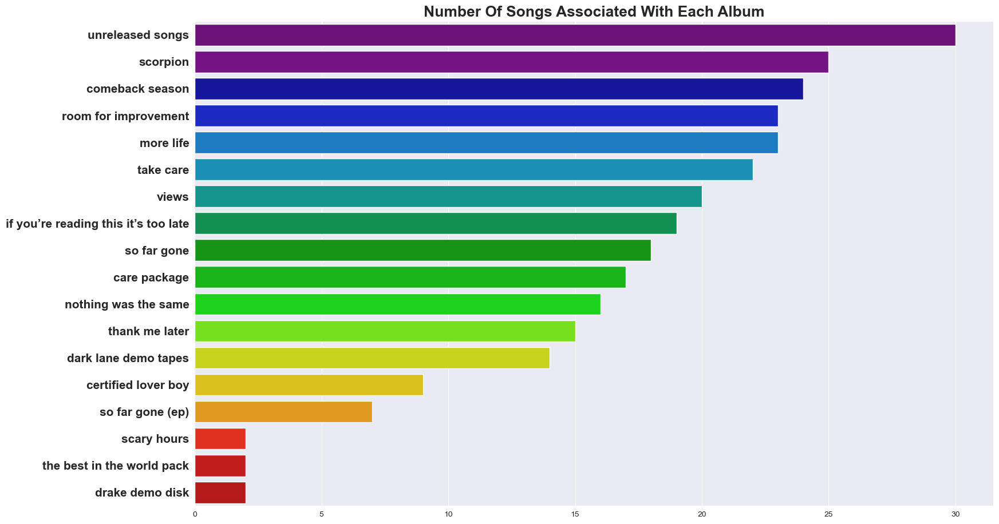

In [6]:

plt.title('Number Of Songs Associated With Each Album',fontsize=19,fontweight='bold')
ax = sns.barplot(y=preprocessed.album.value_counts().index,x=preprocessed.album.value_counts().values,palette='nipy_spectral')
ax.set_yticklabels(ax.get_yticklabels(),fontsize=15,fontweight='bold')
plt.show()


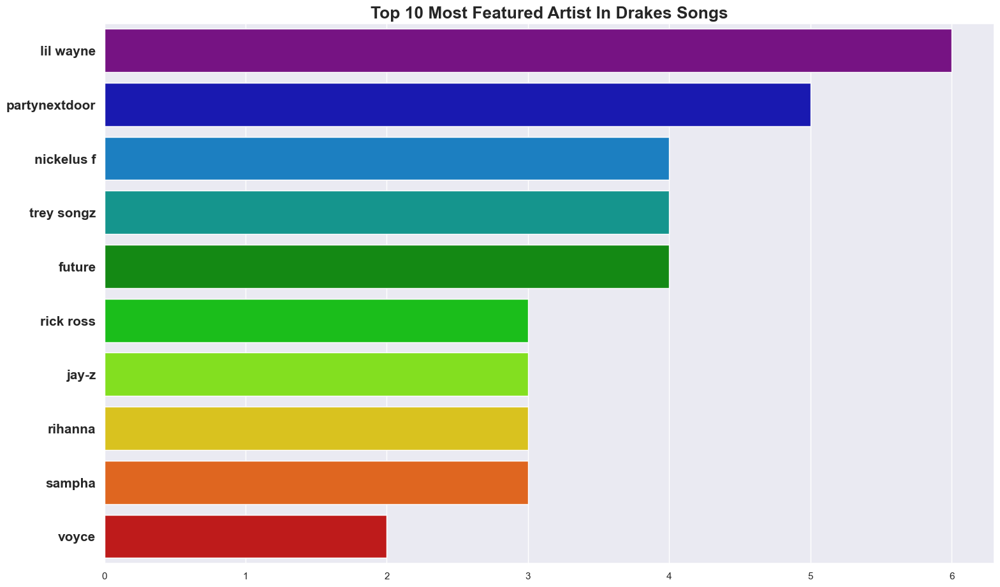

In [78]:
plt.title('Top 10 Most Featured Artist In Drakes Songs',fontsize=19,fontweight='bold')
ax = sns.barplot(y=preprocessed.featuring.value_counts()[1:11].index,x=preprocessed.featuring.value_counts()[1:11].values,palette='nipy_spectral')
ax.set_yticklabels(ax.get_yticklabels(),fontsize=15,fontweight='bold')
plt.show()




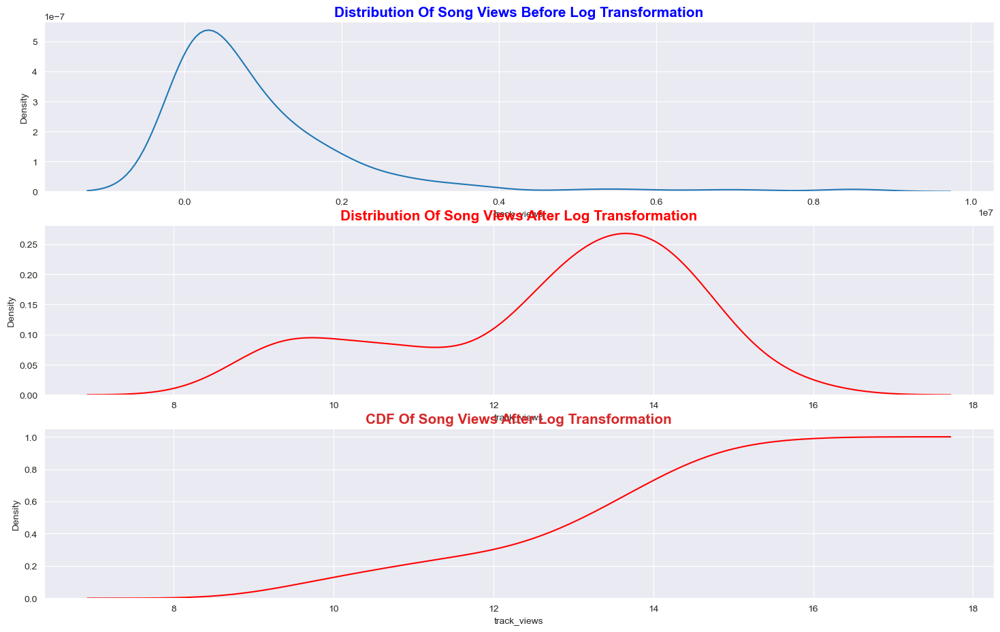

In [7]:
plt.subplot(3,1,1)
plt.title('Distribution Of Song Views Before Log Transformation',fontsize=15,fontweight='bold',color='b')
sns.kdeplot(preprocessed.track_views)
plt.subplot(3,1,2)
preprocessed.track_views= np.log(preprocessed.track_views)
plt.title('Distribution Of Song Views After Log Transformation',fontsize=15,fontweight='bold',color='r')
sns.kdeplot(preprocessed.track_views,color='r')
plt.subplot(3,1,3)
plt.title('CDF Of Song Views After Log Transformation',fontsize=15,fontweight='bold',color='tab:red')
sns.kdeplot(preprocessed.track_views,color='r',cumulative=True)
plt.show()

<Axes: title={'center': 'Distribution Of Different Amounts of Choruses In Drakes Songs'}, xlabel='number_of_chorus', ylabel='Density'>

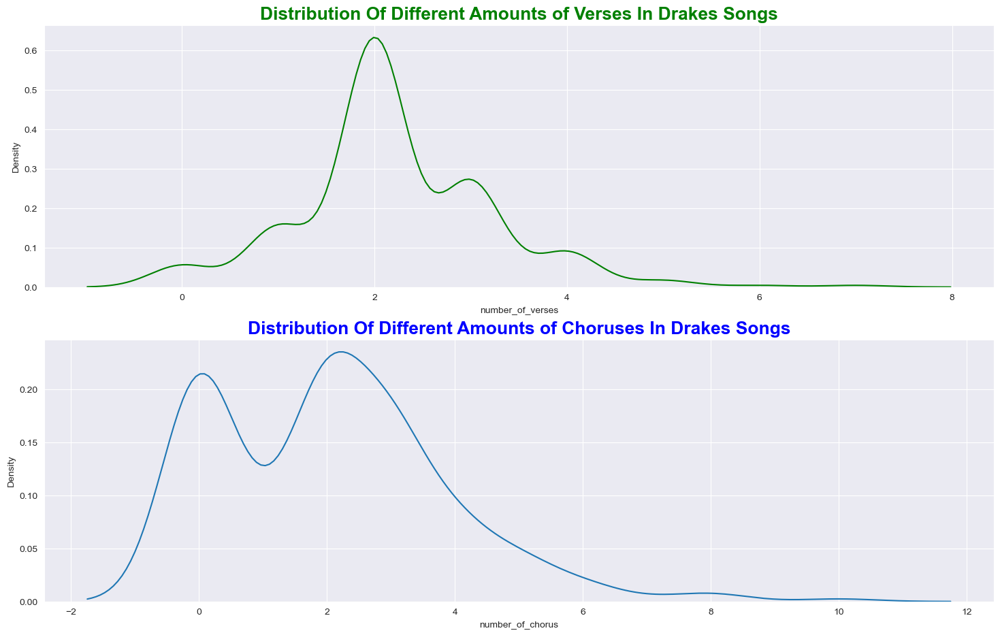

In [8]:
plt.subplot(2,1,1)
plt.title('Distribution Of Different Amounts of Verses In Drakes Songs',fontsize=19,fontweight='bold',color='g')
sns.kdeplot(preprocessed.number_of_verses,color='g')
plt.subplot(2,1,2)
plt.title('Distribution Of Different Amounts of Choruses In Drakes Songs',fontsize=19,fontweight='bold',color='b')
sns.kdeplot(preprocessed.number_of_chorus)

In [9]:
fig = go.Figure()
album_d = album_d.sort_values(by='Release_Year')
album_dm = album_d.groupby(by='Release_Year').mean().reset_index()

for column in album_dm.columns[:-1]:
    fig.add_trace(
        go.Scatter(
            x = album_dm.Release_Year,
            y = album_dm[column],
            name = column,
        )
    )
    

btns = []
for x,col in enumerate(album_dm.columns[:-1]):
    bol = [False]*12
    bol[x]=True
    d = dict(label = col,
                  method = 'update',
                  args = [{'visible':bol},
                          {'title': 'Distribution of [' +col+'] Over The Years',
                           'showlegend':True}])
    btns.append(d)
    
    
fig.update_layout(title='Feautres Distribution Over The Years',
    updatemenus=[go.layout.Updatemenu(
        active=0,
        showactive=True,
        buttons=btns
        )
    ])

fig.show()

In [10]:
album_mean = album_d.sort_values(by='Release_Year')

album_year_index =[album + "  "+ str(year) for album,year in zip(album_mean.index,album_mean.Release_Year)]

fig = go.Figure()
fig.add_trace(go.Scatter(x=album_year_index, y=album_mean['Positive Sentiment'],
                    mode='lines+markers',
                    name='Mean Positive Sentiment Value',hovertext=album_mean['Release_Year']))
fig.add_trace(go.Scatter(x=album_year_index, y=album_mean['Negative Sentiment'],
                    mode='lines+markers',
                    name='Mean Negative Sentiment Value',hovertext=album_mean['Release_Year']))

fig.update_layout(title='Album Sentiment Change Over The Years')
fig.show()
#album_mean

In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=album_year_index, y=album_mean['number_of_verses'],
                    mode='lines+markers',
                    name='Mean Verse Amount',hovertext=album_mean['Release_Year']))
fig.add_trace(go.Scatter(x=album_year_index, y=album_mean['number_of_chorus'],
                    mode='lines+markers',
                    name='Mean Chorus Amount',hovertext=album_mean['Release_Year']))

fig.update_layout(title='Album Chorus and Verse Count Change Over The Years')
fig.show()

In [12]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=album_year_index, y=album_mean['track_views'],
                    mode='lines+markers',
                    name='Mean Verse Amount',hovertext=album_mean['Release_Year']))

fig.update_layout(title='Album Views Over The Years')
fig.show()


In [13]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))



s_val =preprocessed.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1),
    row=1, col=1
)


s_val =preprocessed.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Correlations Between Our Different Numeric Features")
fig.show()

C:\Users\bhakt\AppData\Local\Temp\ipykernel_31852\1605155061.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

C:\Users\bhakt\AppData\Local\Temp\ipykernel_31852\1605155061.py:15: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



# Task 4

In [94]:
# Data Cleaning
# Checking for missing values
missing_values = preprocessed.isnull().sum()
print("Missing Values in CSV Data:")
print(missing_values)

# Dropping duplicated entries
drake_data = preprocessed.drop_duplicates()

# missing_values = preprocessed.isnull().sum()
# print("Missing Values in CSV Data:")
# print(missing_values)

Missing Values in CSV Data:
album           0
lyrics_title    0
lyrics          0
track_views     0
is_demo         0
               ..
youre           0
youve           0
yuh             0
yup             0
zone            0
Length: 1016, dtype: int64


In [95]:
# Print the original lyrics
print("Original Lyrics:")
for line in drake_lyrics[:3]:  # Displaying the first 3 lines for illustration
    print(line)


Original Lyrics:
"[Verse]

Put my feelings on ice

Always been a gem



In [96]:
#Data Transformation & Normalization:
# Tokenization (split text into words)
tokens = [line.split() for line in drake_lyrics]

# Text normalization (convert to lowercase and remove punctuation)
cleaned_lyrics = []
for token_list in tokens:
    cleaned_tokens = [token.lower().strip('.,!?') for token in token_list]
    cleaned_lyrics.append(cleaned_tokens)
    
# Print the cleaned and normalized lyrics
print("\nCleaned and Normalized Lyrics:")
for cleaned_tokens in cleaned_lyrics[:3]:  # Displaying the first 3 lines for illustration
    print(cleaned_tokens)    


Cleaned and Normalized Lyrics:
['"[verse]']
['put', 'my', 'feelings', 'on', 'ice']
['always', 'been', 'a', 'gem']


In [97]:
# Remove stop words (example)
from nltk.corpus import stopwords
stop_words = set(stopwords.words("english"))
filtered_lyrics = [
    [word for word in tokens if word not in stop_words]
    for tokens in cleaned_lyrics
]

# Perform TF-IDF vectorization (example)
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform([" ".join(tokens) for tokens in filtered_lyrics])

# Print the cleaned and normalized lyrics for the entire dataset
for cleaned_tokens in cleaned_lyrics:
    print(cleaned_tokens)


['"[verse]']
['put', 'my', 'feelings', 'on', 'ice']
['always', 'been', 'a', 'gem']
['certified', 'lover', 'boy', 'somehow', 'still', 'heartless']
['heart', 'is', 'only', "gettin'", 'colder"']
['"[verse]']
['hands', 'are', 'tied']
["someone's", 'in', 'my', 'ear', 'from', 'the', 'other', 'side']
["tellin'", 'me', 'that', 'i', 'should', 'pay', 'you', 'no', 'mind']
['wanted', 'you', 'to', 'not', 'be', 'with', 'me', 'all', 'night']
['wanted', 'you', 'to', 'not', 'stay', 'with', 'me', 'all', 'night']
['i', 'know', 'you', 'know', 'who', 'that', 'person', 'is', 'to', 'me']
["doesn't", 'really', 'change', 'things']
[]
['[chorus]']
['i', 'know', "you're", 'scared', 'of', 'dating', 'falling', 'for', 'me']
['shorty', 'surely', 'you', 'know', 'me']
['right', 'here', 'for', 'you', 'always']
['you', 'know', 'i', "don't", 'ever', 'change']
['right', 'here', 'for', 'you', 'always']
['you', 'know', 'i', "don't", 'ever', 'change']
['right', 'here', 'for', 'you']
[]
['[bridge]']
['in', 'mind', 'you', 'mak

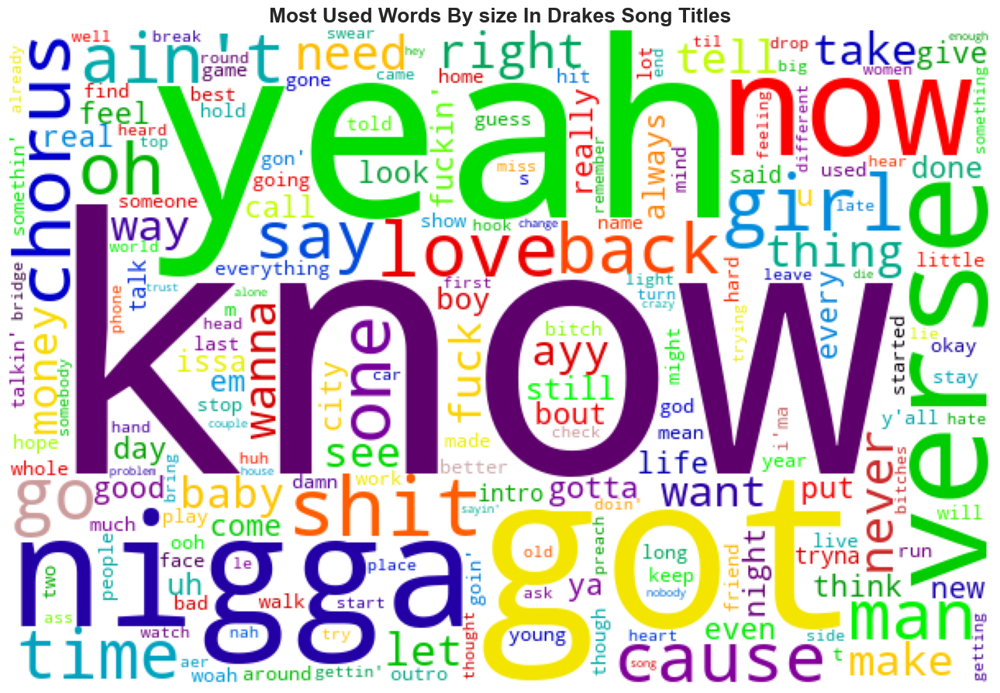

In [27]:
# Iterate through the list and join each element into a single string
l_t = ' '.join([' '.join(lyrics) for lyrics in cleaned_lyrics]).strip().replace('drake', '')
l_t = l_t.replace('ft', '')

# Generate the word cloud
w_c = WordCloud(
    width=600, height=400, collocations=False, stopwords=STOPWORDS,
    colormap='nipy_spectral', background_color='white'
).generate(l_t)

# Plot the word cloud
plt.title('Most Used Words By size In Drakes Song Titles', fontsize=19, fontweight='bold')
plt.imshow(w_c)
plt.axis('off')
plt.show()




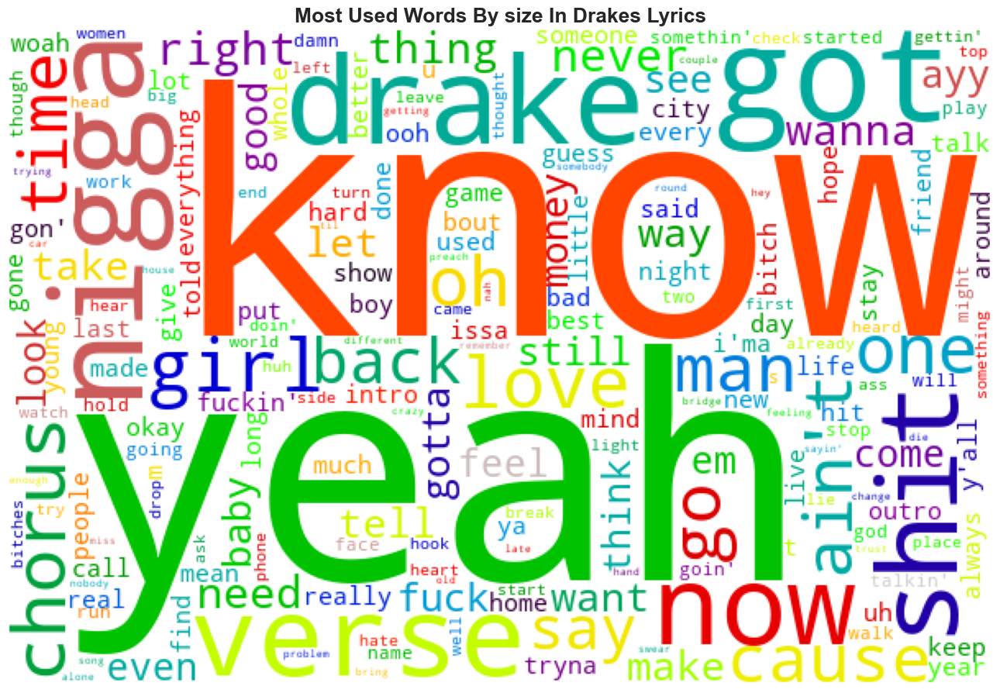

In [18]:
# Flatten the list of lists into a single list of strings
l_t = ' '.join([lyric for sublist in cleaned_lyrics for lyric in sublist]).strip()
w_c = WordCloud(
    width=600, height=400, collocations=False, stopwords=STOPWORDS,
    colormap='nipy_spectral', background_color='white'
).generate(l_t)

# Plot the word cloud
plt.title('Most Used Words By size In Drakes Lyrics', fontsize=19, fontweight='bold')
plt.imshow(w_c)
plt.axis('off')
plt.show()


In [20]:
#preprocessed.lyrics
w1_dict = dict()
for word in l_t.split():
    w= word.strip()
    if w in STOPWORDS:
        continue
    else:
        w1_dict[w] = w1_dict.get(w,0)+1
w1_dict = {k: v for k, v in sorted(w1_dict.items(), key=lambda item: item[1],reverse=True)}

w2_dict = dict()

top_10_w1 = list(w1_dict.keys())[:10]
token=nltk.word_tokenize(l_t)
trigram =ngrams(token,3)
trigram = [k for k in trigram if k[0] in top_10_w1]

In [32]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\bhakt\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

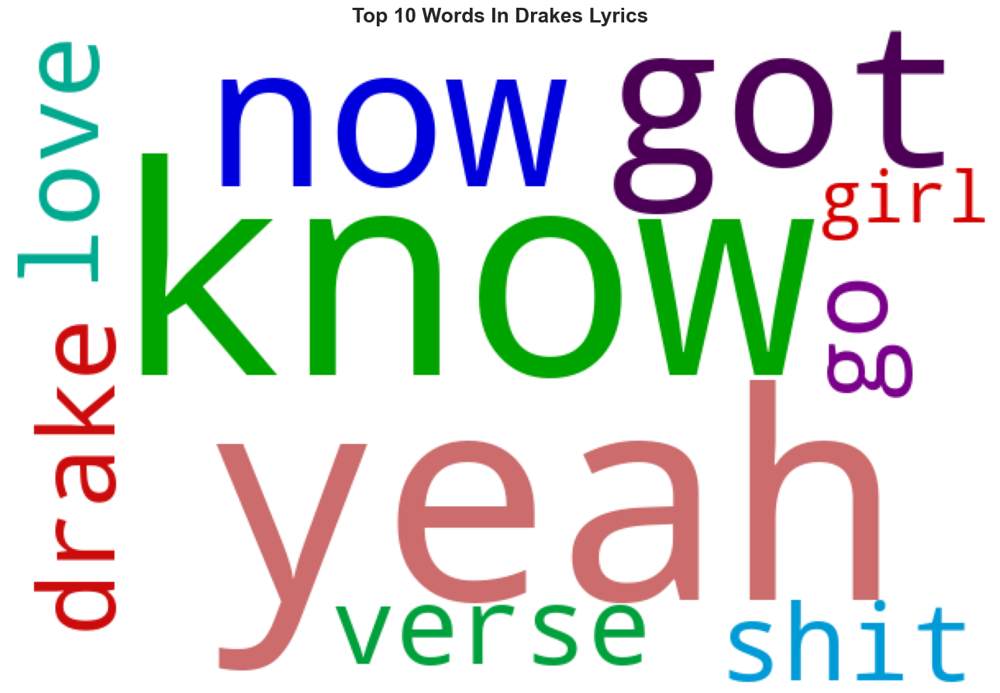

In [21]:
w_c = WordCloud(width=600,height=400,collocations = False,colormap='nipy_spectral',background_color='white').generate(' '.join(top_10_w1))
plt.title('Top 10 Words In Drakes Lyrics',fontsize=19,fontweight='bold')
plt.imshow(w_c)
plt.axis('off')
plt.show()

In [36]:
token=nltk.word_tokenize(l_t)
bigram=ngrams(token,2)
bigram_dict = dict()
for i in bigram:
    bigram_dict[i] = bigram_dict.get(i,0)+1
    
trigram_dict = dict()
for i in trigram:
    trigram_dict[i] = trigram_dict.get(i,0)+1
    
tri_gram =pd.DataFrame(list(trigram_dict.keys())[:15],columns=['One Of Top 10 Words','Second Word','Third Word'])

def get_prob(sir):
    key = (sir['One Of Top 10 Words'],sir['Second Word'],sir['Third Word'])
    w3 = trigram_dict[key]
    w2 = bigram_dict[(sir['One Of Top 10 Words'],sir['Second Word'])]
    return w3/w2

tri_gram['Probabilty Of Sentence'] = tri_gram.apply(get_prob,axis=1)

tri_gram.style.background_gradient(cmap='coolwarm')

,One Of Top 10 Words,Second Word,Third Word,Probabilty Of Sentence
0,know,you,know,0.125926
1,know,who,that,0.032258
2,know,you,'re,0.148148
3,know,me,right,0.043478
4,know,i,do,0.073034
5,love,you,like,0.192982
6,now,you,know,0.112676
7,yeah,we,back,0.076923
8,shit,done,went,1.000000
9,shit,this,is,0.750000


In [22]:
NUMBER_OF_COMPONENTS=100

CV = CountVectorizer()
svd = TruncatedSVD(NUMBER_OF_COMPONENTS)

c_matrix = CV.fit_transform(preprocessed.lyrics)

dec_matrix = svd.fit_transform(c_matrix)
dec_df=pd.DataFrame(dec_matrix,columns=['PC_{}'.format(i) for i in range(1,NUMBER_OF_COMPONENTS+1)])

ex_var = svd.explained_variance_ratio_
variance_cum = np.cumsum(ex_var)
data = [go.Scatter(x=np.arange(0,len(variance_cum)),y=variance_cum,name='Cumulative Explained Variance',mode='lines+markers'),
        go.Scatter(x=np.arange(0,len(variance_cum)),y=ex_var,name='Explained Variance',mode='lines+markers')]
layout = dict(title='Explained Variance Ratio Using {} Words'.format(NUMBER_OF_COMPONENTS),
             xaxis_title='# Componenets',yaxis_title='Explained Variance',height=650,width=900)
fig = go.Figure(data=data,layout=layout)
fig.update_layout(template='seaborn')
fig.show()

In [23]:
dec_df.head(5)

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,...,PC_91,PC_92,PC_93,PC_94,PC_95,PC_96,PC_97,PC_98,PC_99,PC_100
0,0.521785,-0.229203,-0.218660,0.409704,-0.107594,0.071091,0.660624,0.088655,0.025716,-0.436274,...,0.188439,-0.139809,-0.096776,-0.126418,0.041150,-0.133339,-0.012307,0.001286,-0.013138,0.263233
1,22.000534,17.978073,-2.968096,-2.496969,0.963423,4.708171,-0.744390,2.906958,3.609326,1.233808,...,1.507736,0.301669,-0.346698,-0.114315,-0.695057,-1.397633,-0.329501,0.000426,1.205100,-0.996026
2,43.907710,-14.222603,-3.989767,-5.146986,-0.456484,0.515097,-2.067408,-9.994806,-11.939300,0.771517,...,-4.411970,9.276339,0.849411,0.331414,4.857968,-1.088231,-1.358056,-1.535153,-4.335547,-1.642908
3,29.095665,-15.082048,-4.301063,-8.957937,3.764895,-11.905055,-1.523204,0.988250,6.870096,-1.740826,...,-2.147111,-0.203673,1.245907,0.248177,0.600769,0.819983,0.645397,-1.267427,0.668091,2.132352
4,34.884141,5.540462,-2.486184,0.845414,-0.863458,-0.496207,0.910448,-2.391336,-4.497888,-0.254537,...,-1.727181,-0.967822,0.912277,-0.685638,0.143614,-0.558369,0.057628,0.110481,-0.184441,1.121754


In [24]:
from sklearn.preprocessing import MinMaxScaler

# Select the columns that need to be normalized
columns_to_normalize = ['track_views', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment',
                         '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Apply Min-Max scaling to the selected columns
preprocessed[columns_to_normalize] = scaler.fit_transform(preprocessed[columns_to_normalize])


In [25]:
preprocessed.head(5
                 )

,album,lyrics_title,lyrics,track_views,is_demo,featuring,number_of_verses,number_of_chorus,Positive Sentiment,Neutral Sentiment,Negative Sentiment,# Of Words,# Of StopWords,Average Word Length,Average Sentence Length
0,certified lover boy,certified lover boy,put my feelings on ice always been a gem cert...,0.053400,0,solo,1,0,0.355721,0.504202,0.368421,0.005613,0.001923,0.890050,0.011780
1,certified lover boy,like im supposed todo things,hands are tied someones in my ear from the ot...,0.258972,0,solo,1,2,0.318408,0.676471,0.185596,0.154350,0.175000,0.671070,0.144914
2,certified lover boy,not around,yeah we back wassup ladies swishahouse baby w...,0.425010,0,solo,2,3,0.134328,0.594538,0.498615,0.515435,0.540385,0.777028,0.493829
3,certified lover boy,in the cut,ayy yeah pipe this shit up and i turn this sh...,0.344170,0,roddy ricch,2,2,0.390547,0.516807,0.315789,0.303087,0.315385,0.711652,0.288332
4,certified lover boy,zodiac sign,you ask how many girls i been with in my life...,0.306445,0,jessie reyez,2,0,0.407960,0.535714,0.271468,0.403181,0.444231,0.890050,0.403141


In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re

# Tokenization and stop words removal
def process_text(text):
    # Tokenization (you can use more advanced methods based on your needs)
    tokens = re.findall(r'\b\w+\b', text.lower())
    
    # Remove stop words
    tokens = [token for token in tokens if token not in ENGLISH_STOP_WORDS]
    
    return ' '.join(tokens)

# Apply text processing to the 'lyrics' column
preprocessed['processed_lyrics'] = preprocessed['lyrics'].apply(process_text)

# TF-IDF feature extraction
tfidf_vectorizer = TfidfVectorizer(max_features=1000)  # You can adjust max_features based on your requirements
tfidf_matrix = tfidf_vectorizer.fit_transform(preprocessed['processed_lyrics'])

# Create a DataFrame with TF-IDF features
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Concatenate the TF-IDF features with the original preprocessed DataFrame
preprocessed = pd.concat([preprocessed, tfidf_df], axis=1)
# Display processed lyrics and TF-IDF features
print(preprocessed[['lyrics', 'processed_lyrics']].head())

# Display the TF-IDF matrix (first 5 rows and columns)
print(tfidf_df.head())


                                              lyrics  lyrics  \
0   put my feelings on ice always been a gem cert...     0.0   
1   hands are tied someones in my ear from the ot...     0.0   
2   yeah we back wassup ladies swishahouse baby w...     0.0   
3   ayy yeah pipe this shit up and i turn this sh...     0.0   
4   you ask how many girls i been with in my life...     0.0   

                                    processed_lyrics  
0  feelings ice gem certified lover boy heartless...  
1  hands tied someones ear tellin pay mind wanted...  
2  yeah wassup ladies swishahouse baby wassup lad...  
3  ayy yeah pipe shit turn shit diamonds fun like...  
4  ask girls life tell ya stopped keeping count 2...  
    20   22   40  6ix  accept  account  act  actin    acting  admit  ...   yo  \
0  0.0  0.0  0.0  0.0     0.0      0.0  0.0    0.0  0.000000    0.0  ...  0.0   
1  0.0  0.0  0.0  0.0     0.0      0.0  0.0    0.0  0.000000    0.0  ...  0.0   
2  0.0  0.0  0.0  0.0     0.0      0.0  0.

In [38]:
preprocessed = preprocessed.dropna()
preprocessed.head()

,album,lyrics_title,lyrics,track_views,is_demo,featuring,number_of_verses,number_of_chorus,Positive Sentiment,Neutral Sentiment,...,yo,york,youd,youll,young,youre,youve,yuh,yup,zone
0,certified lover boy,certified lover boy,put my feelings on ice always been a gem cert...,0.053400,0.0,solo,1.0,0.0,0.355721,0.504202,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
1,certified lover boy,like im supposed todo things,hands are tied someones in my ear from the ot...,0.258972,0.0,solo,1.0,2.0,0.318408,0.676471,...,0.0,0.0,0.0,0.0,0.0,0.115158,0.0,0.0,0.0,0.0
2,certified lover boy,not around,yeah we back wassup ladies swishahouse baby w...,0.425010,0.0,solo,2.0,3.0,0.134328,0.594538,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
3,certified lover boy,in the cut,ayy yeah pipe this shit up and i turn this sh...,0.344170,0.0,roddy ricch,2.0,2.0,0.390547,0.516807,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
4,certified lover boy,zodiac sign,you ask how many girls i been with in my life...,0.306445,0.0,jessie reyez,2.0,0.0,0.407960,0.535714,...,0.0,0.0,0.0,0.0,0.0,0.085280,0.0,0.0,0.0,0.0


# Task 5

In [43]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error

# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Linear Regression model
linear_reg_model = LinearRegression()

# Train the Linear Regression model
linear_reg_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = linear_reg_model.predict(X_test)

# Evaluate the model using cross-validation with a regression metric
neg_mse_scores_LR = cross_val_score(linear_reg_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Calculate mean and standard deviation of negative mean squared error scores
mean_neg_mse_LR = neg_mse_scores_LR.mean()
std_neg_mse_LR = neg_mse_scores_LR.std()

# Calculate other regression metrics
mae_LR = mean_absolute_error(y_test, y_pred)
r2_LR = r2_score(y_test, y_pred)
rmse_LR = np.sqrt(np.abs(mean_neg_mse_LR))
# Print the root mean squared error after taking the absolute value
print('Mean Negative Mean Squared Error (MSE) for Linear Regression :', mean_neg_mse_LR)
print('Standard Deviation for Linear Regression:', std_neg_mse_LR)
print(f"Root Mean Squared Error for Linear Regression (RMSE): {rmse_LR}")
print(f"Mean Absolute Error for Linear Regression(MAE): {mae_LR}")
print(f"R-squared Score for Linear Regression(R2): {r2_LR}")


Mean Negative Mean Squared Error (MSE) for Linear Regression : -0.04966455028507945
Standard Deviation for Linear Regression: 0.011257428260562181
Root Mean Squared Error for Linear Regression (RMSE): 0.2228554470617208
Mean Absolute Error for Linear Regression(MAE): 0.22370474766007137
R-squared Score for Linear Regression(R2): 0.1438869824055553


In [54]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

# Select the columns that need to be used as features for RandomForestRegressor
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Train the Random Forest Regressor
rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_regressor.predict(X_test)

# Evaluate the model using cross-validation with a regression metric
neg_mse_scores_RF = cross_val_score(rf_regressor, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Calculate mean and standard deviation of negative mean squared error scores
mean_neg_mse_RF = neg_mse_scores_RF.mean()
std_neg_mse_RF = neg_mse_scores_RF.std()

# Perform cross-validation with mean squared error as the scoring metric
cross_val_scores_RF = cross_val_score(rf_regressor, X, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores_RF = np.sqrt(-cross_val_scores_RF)

print('Mean Negative Mean Squared Error(MSE) for Random Forest Regressor:', mean_neg_mse_RF)
print('Standard Deviation for Random Forest Regressor:', std_neg_mse_RF)

# Evaluate the model
rmse_RF = mean_squared_error(y_test, y_pred, squared=False)
print(f"Root Mean Squared Error (RMSE) for Random Forest Regressor: {rmse_RF}")
print("Cross-Validation Scores for Random Forest Regressor:")
print(rmse_scores_RF)

Mean Negative Mean Squared Error(MSE) for Random Forest Regressor: -0.05150533852844134
Standard Deviation for Random Forest Regressor: 0.01006837537504397
Root Mean Squared Error (RMSE) for Random Forest Regressor: 0.25041605520894816
Cross-Validation Scores for Random Forest Regressor:
[0.18185002 0.22688325 0.26577435 0.15617557 0.44569692]


In [73]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score


# Select the columns that need to be used as features for GradientBoostingRegressor
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Initialize the model
gradient_boosting_model = GradientBoostingRegressor(random_state=42)

# Train the model
gradient_boosting_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = gradient_boosting_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

# Print the regression metrics
print(f'Mean Squared Error for GradientBoostingRegressor (MSE): {mse}')
print(f'Root Mean Squared Error for GradientBoostingRegressor (RMSE): {rmse}')
print(f'Mean Absolute Error for GradientBoostingRegressor (MAE): {mae}')
print(f'R-squared for GradientBoostingRegressor (R2): {r2}')
print(f'Explained Variance Score for GradientBoostingRegressor (EVS): {evs}')

Mean Squared Error for GradientBoostingRegressor (MSE): 0.06257951939060671
Root Mean Squared Error for GradientBoostingRegressor (RMSE): 0.25015898822670096
Mean Absolute Error for GradientBoostingRegressor (MAE): 0.1970923563317287
R-squared for GradientBoostingRegressor (R2): 0.1804013611818468
Explained Variance Score for GradientBoostingRegressor (EVS): 0.18701584433919183


In [67]:
from sklearn.svm import SVR

# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize the SVR model
svr_model = SVR()

# Train the SVR model
svr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svr = svr_model.predict(X_test)

# Evaluate the SVR model
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
evs_svr = explained_variance_score(y_test, y_pred_svr)

# Print the regression metrics for SVR
print(f'Mean Squared Error (MSE) - SVR: {mse_svr}')
print(f'Root Mean Squared Error (RMSE) - SVR: {rmse_svr}')
print(f'Mean Absolute Error (MAE) - SVR: {mae_svr}')
print(f'R-squared (R2) - SVR: {r2_svr}')
print(f'Explained Variance Score (EVS) - SVR: {evs_svr}')

Mean Squared Error (MSE) - SVR: 0.055946301457402633
Root Mean Squared Error (RMSE) - SVR: 0.23652970523256192
Mean Absolute Error (MAE) - SVR: 0.20476116885435547
R-squared (R2) - SVR: 0.2672760518470849
Explained Variance Score (EVS) - SVR: 0.26819221834741813


In [30]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score

# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the neural network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions on the test set
y_pred_nn = model.predict(X_test).flatten()

# Evaluate the Neural Network model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
r2_nn = r2_score(y_test, y_pred_nn)
evs_nn = explained_variance_score(y_test, y_pred_nn)

# Print the regression metrics for the Neural Network
print(f'Mean Squared Error (MSE) - Neural Network: {mse_nn}')
print(f'Root Mean Squared Error (RMSE) - Neural Network: {rmse_nn}')
print(f'R-squared (R2) - Neural Network: {r2_nn}')
print(f'Explained Variance Score (EVS) - Neural Network: {evs_nn}')

Epoch 1/50
6/6 [==============================] - 1s 31ms/step - loss: 0.0842 - val_loss: 0.0741
Epoch 2/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0732 - val_loss: 0.0676
Epoch 3/50
6/6 [==============================] - 0s 12ms/step - loss: 0.0633 - val_loss: 0.0635
Epoch 4/50
6/6 [==============================] - 0s 8ms/step - loss: 0.0576 - val_loss: 0.0631
Epoch 5/50
6/6 [==============================] - 0s 8ms/step - loss: 0.0529 - val_loss: 0.0628
Epoch 6/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0503 - val_loss: 0.0620
Epoch 7/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0469 - val_loss: 0.0588
Epoch 8/50
6/6 [==============================] - 0s 8ms/step - loss: 0.0466 - val_loss: 0.0586
Epoch 9/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0445 - val_loss: 0.0627
Epoch 10/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0437 - val_loss: 0.0610
Epoch 11/50
6/6 [====================

Original Linear Regression RMSE: 0.2212967325303663
Polynomial Regression RMSE: 0.45024708824006493
Linear Regression with Standard Scaler RMSE: 0.2212967325303659


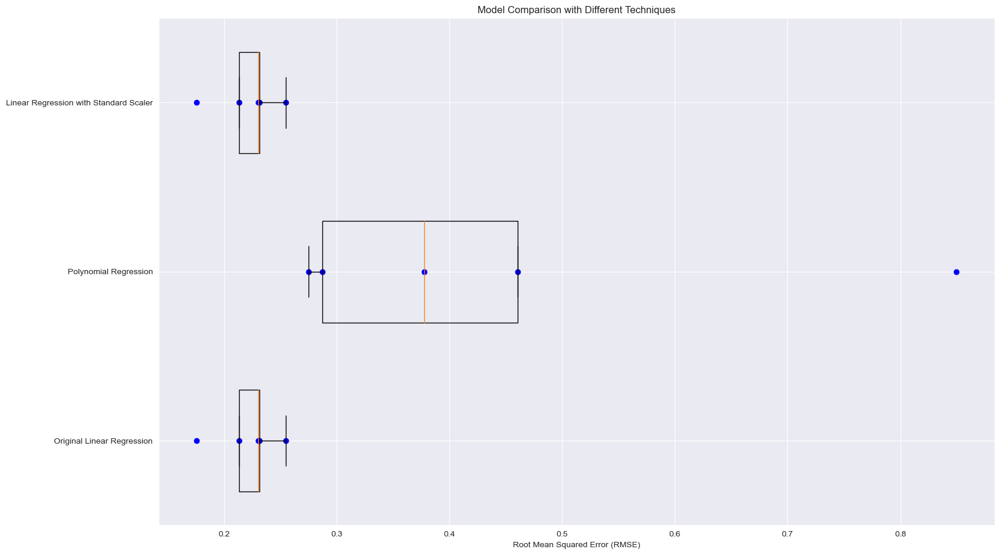

In [52]:
#Task 

from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# Assume X_train, y_train, X_test, y_test are your training and testing data
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Original Linear Regression
linear_reg_model = LinearRegression()
original_scores = np.sqrt(-cross_val_score(linear_reg_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))

# Feature Engineering: Polynomial Features
degree = 2  # You can experiment with different degrees
polyreg = make_pipeline(PolynomialFeatures(degree), LinearRegression())
poly_scores = np.sqrt(-cross_val_score(polyreg, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))

# Data Normalization: Standard Scaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
scaled_linear_reg_model = LinearRegression()
scaled_scores = np.sqrt(-cross_val_score(scaled_linear_reg_model, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error'))

# Print and compare the results
print("Original Linear Regression RMSE:", original_scores.mean())
print("Polynomial Regression RMSE:", poly_scores.mean())
print("Linear Regression with Standard Scaler RMSE:", scaled_scores.mean())

# Visualization: Compare Cross-Validation Scores
fig, ax = plt.subplots()
models = ['Original Linear Regression', 'Polynomial Regression', 'Linear Regression with Standard Scaler']
scores = [original_scores, poly_scores, scaled_scores]

for i, model in enumerate(models):
    ax.boxplot(scores[i], positions=[i + 1], widths=0.6, vert=False, showfliers=False)
    ax.scatter(scores[i], [i + 1] * len(scores[i]), marker='o', color='blue')

ax.set_yticks(np.arange(1, len(models) + 1))
ax.set_yticklabels(models)
ax.set_xlabel('Root Mean Squared Error (RMSE)')
plt.title('Model Comparison with Different Techniques')
plt.show()


Original Random Forest Regressor RMSE: 0.13847300452531272
Random Forest Regressor with Standard Scaler RMSE: 0.13913465152578847


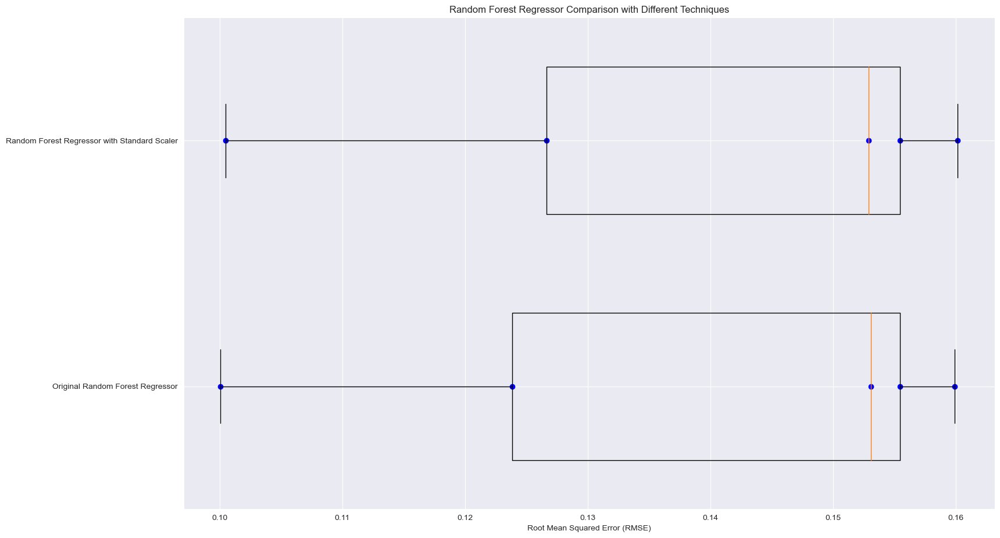

In [66]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# Assume X_train, y_train, X_test, y_test are your training and testing data
# Select the columns that need to be used as features for Random Forest Regressor
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# # Initialize the Random Forest Regressor
# rf_regressor = RandomForestRegressor(random_state=42)

# # Train the Random Forest Regressor
# rf_regressor.fit(X_train, y_train)

# # Make predictions on the test set
# y_pred = rf_regressor.predict(X_test)

# Original Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
original_scores = np.sqrt(-cross_val_score(rf_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))

# Data Normalization: Standard Scaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
scaled_rf_model = RandomForestRegressor(random_state=42)
scaled_scores = np.sqrt(-cross_val_score(scaled_rf_model, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error'))

# Print and compare the results
print("Original Random Forest Regressor RMSE:", original_scores.mean())
print("Random Forest Regressor with Standard Scaler RMSE:", scaled_scores.mean())

# Visualization: Compare Cross-Validation Scores
fig, ax = plt.subplots()
models = ['Original Random Forest Regressor', 'Random Forest Regressor with Standard Scaler']
scores = [original_scores, scaled_scores]

for i, model in enumerate(models):
    ax.boxplot(scores[i], positions=[i + 1], widths=0.6, vert=False, showfliers=False)
    ax.scatter(scores[i], [i + 1] * len(scores[i]), marker='o', color='blue')

ax.set_yticks(np.arange(1, len(models) + 1))
ax.set_yticklabels(models)
ax.set_xlabel('Root Mean Squared Error (RMSE)')
plt.title('Random Forest Regressor Comparison with Different Techniques')
plt.show()


Original Gradient Boosting Regressor RMSE: 0.2370969291141257
Gradient Boosting Regressor with Standard Scaler RMSE: 0.23600000616596944
Tuned Gradient Boosting Regressor RMSE: 0.22278948392347736
Gradient Boosting Regressor with PCA RMSE: 0.22747743814106142


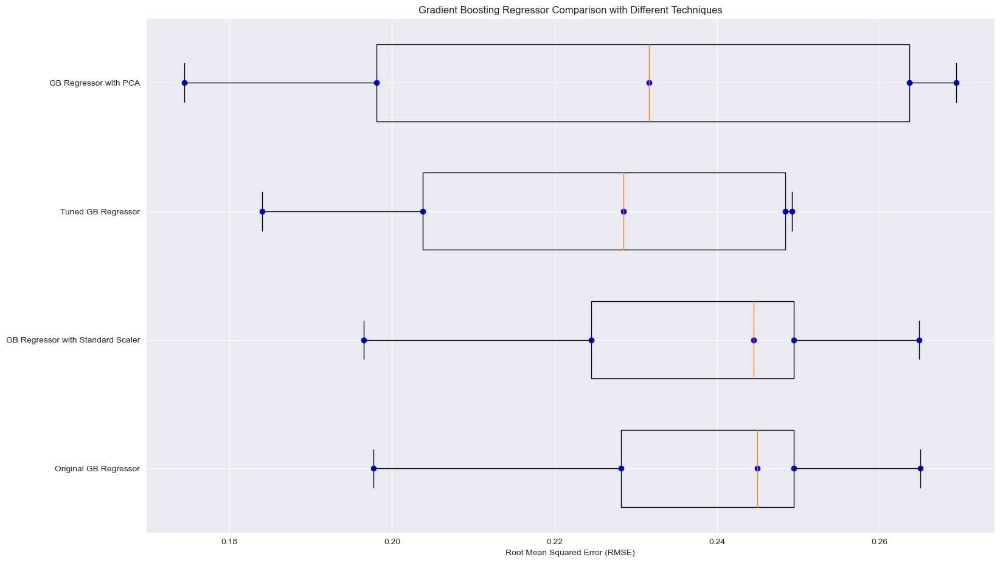

In [32]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Assume X_train, y_train, X_test, y_test are your training and testing data
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Original Gradient Boosting Regressor
gb_model = GradientBoostingRegressor(random_state=42)
original_scores = np.sqrt(-cross_val_score(gb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))

# Data Normalization: Standard Scaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
scaled_gb_model = GradientBoostingRegressor(random_state=42)
scaled_scores = np.sqrt(-cross_val_score(scaled_gb_model, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error'))

# Hyperparameter Tuning: Grid Search
param_grid = {'n_estimators': [50, 100, 150],
              'learning_rate': [0.01, 0.1, 0.2],
              'max_depth': [3, 4, 5]}
grid_search = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
tuned_gb_model = grid_search.best_estimator_
tuned_scores = np.sqrt(-cross_val_score(tuned_gb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))

# Principal Component Analysis (PCA)
pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)
pca_gb_model = GradientBoostingRegressor(random_state=42)
pca_scores = np.sqrt(-cross_val_score(pca_gb_model, X_train_pca, y_train, cv=5, scoring='neg_mean_squared_error'))

# Print and compare the results
print("Original Gradient Boosting Regressor RMSE:", original_scores.mean())
print("Gradient Boosting Regressor with Standard Scaler RMSE:", scaled_scores.mean())
print("Tuned Gradient Boosting Regressor RMSE:", tuned_scores.mean())
print("Gradient Boosting Regressor with PCA RMSE:", pca_scores.mean())

# Visualization: Compare Cross-Validation Scores
fig, ax = plt.subplots()
models = ['Original GB Regressor', 'GB Regressor with Standard Scaler', 'Tuned GB Regressor', 'GB Regressor with PCA']
scores = [original_scores, scaled_scores, tuned_scores, pca_scores]

for i, model in enumerate(models):
    ax.boxplot(scores[i], positions=[i + 1], widths=0.6, vert=False, showfliers=False)
    ax.scatter(scores[i], [i + 1] * len(scores[i]), marker='o', color='blue')

ax.set_yticks(np.arange(1, len(models) + 1))
ax.set_yticklabels(models)
ax.set_xlabel('Root Mean Squared Error (RMSE)')
plt.title('Gradient Boosting Regressor Comparison with Different Techniques')
plt.show()


Original Support Vector Regressor RMSE: 0.12886474850987625
Support Vector Regressor with Standard Scaler RMSE: 0.13562760841859692
Tuned Support Vector Regressor RMSE: 0.12886474850987625
Support Vector Regressor with PCA RMSE: 0.132150668200714


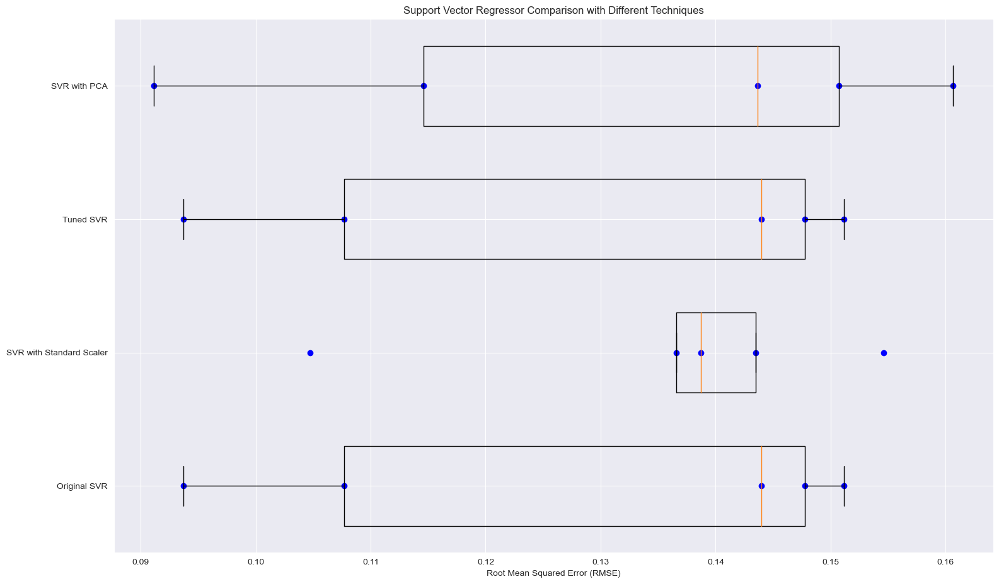

In [68]:
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Assume X_train, y_train, X_test, y_test are your training and testing data
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Original Support Vector Regressor
svr_model = SVR()
original_scores = np.sqrt(-cross_val_score(svr_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))

# Data Normalization: Standard Scaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
scaled_svr_model = SVR()
scaled_scores = np.sqrt(-cross_val_score(scaled_svr_model, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error'))

# Hyperparameter Tuning: Grid Search
param_grid = {'C': [0.1, 1, 10],
              'epsilon': [0.01, 0.1, 0.2],
              'kernel': ['linear', 'rbf']}
grid_search = GridSearchCV(SVR(), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
tuned_svr_model = grid_search.best_estimator_
tuned_scores = np.sqrt(-cross_val_score(tuned_svr_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))

# Principal Component Analysis (PCA)
pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)
pca_svr_model = SVR()
pca_scores = np.sqrt(-cross_val_score(pca_svr_model, X_train_pca, y_train, cv=5, scoring='neg_mean_squared_error'))

# Print and compare the results
print("Original Support Vector Regressor RMSE:", original_scores.mean())
print("Support Vector Regressor with Standard Scaler RMSE:", scaled_scores.mean())
print("Tuned Support Vector Regressor RMSE:", tuned_scores.mean())
print("Support Vector Regressor with PCA RMSE:", pca_scores.mean())

# Visualization: Compare Cross-Validation Scores
fig, ax = plt.subplots()
models = ['Original SVR', 'SVR with Standard Scaler', 'Tuned SVR', 'SVR with PCA']
scores = [original_scores, scaled_scores, tuned_scores, pca_scores]

for i, model in enumerate(models):
    ax.boxplot(scores[i], positions=[i + 1], widths=0.6, vert=False, showfliers=False)
    ax.scatter(scores[i], [i + 1] * len(scores[i]), marker='o', color='blue')

ax.set_yticks(np.arange(1, len(models) + 1))
ax.set_yticklabels(models)
ax.set_xlabel('Root Mean Squared Error (RMSE)')
plt.title('Support Vector Regressor Comparison with Different Techniques')
plt.show()


2/2 [==============================] - 0s 0s/step
Original Neural Network Model RMSE: 0.23678130229750766
Neural Network Model with Standard Scaler RMSE: 0.25445785905110174
Neural Network Model with PCA RMSE: 0.25031370853430546


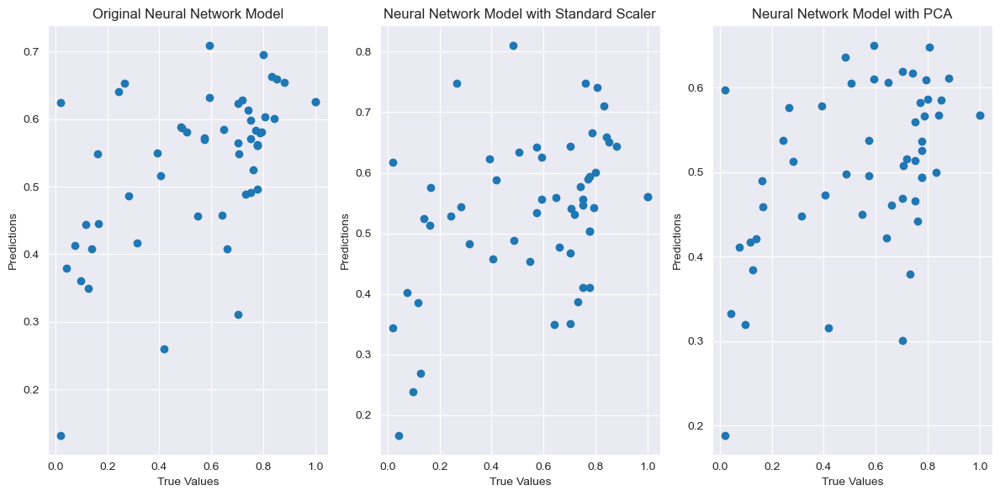

In [33]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assume X_train, y_train, X_test, y_test are your training and testing data
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Build the neural network model
# model = keras.Sequential([
#     keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
#     keras.layers.Dense(32, activation='relu'),
#     keras.layers.Dense(1)  # Output layer with one neuron for regression
# ])

# # Compile the model
# model.compile(optimizer='adam', loss='mean_squared_error')

# # Train the model
# model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# # Make predictions on the test set
# y_pred_nn = model.predict(X_test).flatten()

# Original Neural Network Model
def build_original_model():
    model = keras.Sequential([
        keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        keras.layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

original_model = build_original_model()
original_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)
original_predictions = original_model.predict(X_test)
original_rmse = mean_squared_error(y_test, original_predictions, squared=False)

# Data Normalization: Standard Scaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

scaled_model = build_original_model()
scaled_model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test), verbose=0)
scaled_predictions = scaled_model.predict(X_test_scaled)
scaled_rmse = mean_squared_error(y_test, scaled_predictions, squared=False)

# Principal Component Analysis (PCA)
pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

pca_model = build_original_model()
pca_model.fit(X_train_pca, y_train, epochs=50, batch_size=32, validation_data=(X_test_pca, y_test), verbose=0)
pca_predictions = pca_model.predict(X_test_pca)
pca_rmse = mean_squared_error(y_test, pca_predictions, squared=False)

# Print and compare the results
print("Original Neural Network Model RMSE:", original_rmse)
print("Neural Network Model with Standard Scaler RMSE:", scaled_rmse)
print("Neural Network Model with PCA RMSE:", pca_rmse)

# Visualization: Compare Predictions
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.scatter(y_test, original_predictions)
plt.title('Original Neural Network Model')
plt.xlabel('True Values')
plt.ylabel('Predictions')

plt.subplot(1, 3, 2)
plt.scatter(y_test, scaled_predictions)
plt.title('Neural Network Model with Standard Scaler')
plt.xlabel('True Values')
plt.ylabel('Predictions')

plt.subplot(1, 3, 3)
plt.scatter(y_test, pca_predictions)
plt.title('Neural Network Model with PCA')
plt.xlabel('True Values')
plt.ylabel('Predictions')

plt.tight_layout()
plt.show()


In [35]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming X and y are your feature matrix and target variable
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Create a Linear Regression model
linear_reg_model = LinearRegression()

# Perform 5-fold cross-validation
LR_f1_cross_val_scores = cross_val_score(linear_reg_model, X, y, cv=5, scoring='neg_mean_squared_error')

# Convert the scores to positive as scikit-learn returns negated values for MSE
LR_cross_val_rmse = np.sqrt(-LR_f1_cross_val_scores)

# Print RMSE values for each fold
for i, rmse in enumerate(LR_cross_val_rmse):
    print(f'Fold {i+1} RMSE: {rmse}')

# Print the average RMSE across folds
print(f'Average for Linear Regression RMSE: {LR_cross_val_rmse.mean()}')

Fold 1 RMSE: 0.1802923591229104
Fold 2 RMSE: 0.234040908542814
Fold 3 RMSE: 0.2622843505757176
Fold 4 RMSE: 0.16934026937965035
Fold 5 RMSE: 0.46988466043382204
Average for Linear Regression RMSE: 0.2631685096109829


In [36]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# Assuming X and y are your feature matrix and target variable
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Create a Random Forest Regressor
rf_regressor = RandomForestRegressor()

# Perform 5-fold cross-validation
RF_f1_cross_val_scores = cross_val_score(rf_regressor, X, y, cv=5, scoring='neg_mean_squared_error')

# Convert the scores to positive as scikit-learn returns negated values for MSE
RF_cross_val_rmse = np.sqrt(-RF_f1_cross_val_scores)

# Print RMSE values for each fold
for i, rmse in enumerate(RF_cross_val_rmse):
    print(f'Fold {i+1} RMSE: {rmse}')

# Print the average RMSE across folds
print(f'Average RMSE: {RF_cross_val_rmse.mean()}')

Fold 1 RMSE: 0.17928124792573888
Fold 2 RMSE: 0.22486663016034017
Fold 3 RMSE: 0.2652973377040832
Fold 4 RMSE: 0.15418838824494221
Fold 5 RMSE: 0.4462785293583923
Average RMSE: 0.25398242667869936


In [37]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=('Random Forest Cross Val Scores', 'Linear Regression Cross Val Scores'))

# Assuming RF_f1_cross_val_scores and LR_f1_cross_val_scores are defined
fig.add_trace(
    go.Scatter(x=np.arange(0, len(RF_f1_cross_val_scores)), y=RF_f1_cross_val_scores, name='Random Forest'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=np.arange(0, len(LR_f1_cross_val_scores)), y=LR_f1_cross_val_scores, name='Linear Regression'),
    row=2, col=1
)

fig.update_layout(height=700, width=900, title_text="Different Model 5 Fold Cross Validation")
fig.update_yaxes(title_text="RMSE")
fig.update_xaxes(title_text="Fold #")

fig.show()

In [40]:
#
from sklearn.metrics import mean_absolute_error, r2_score


C:\Users\bhakt\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.244e-02, tolerance: 9.407e-04



RMSE after hyperparameter tuning: 0.2543221883487696


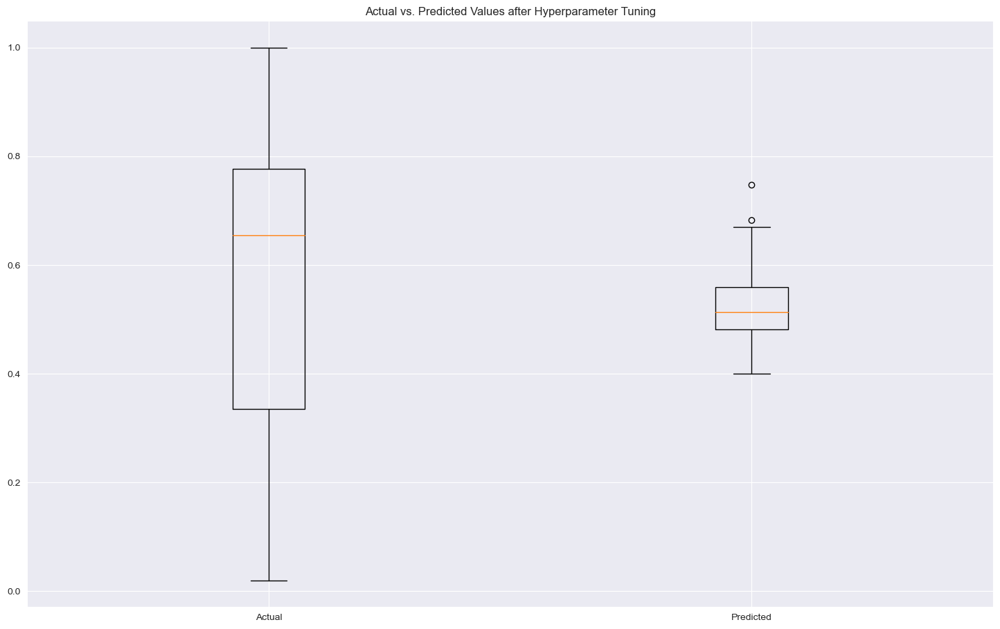

In [53]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso, Ridge
import numpy as np

# Assume X_train, y_train are your training data
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



# Define the hyperparameter grid to search
param_grid = {'alpha': np.logspace(-4, 4, 9)}  # Example values for alpha

# Create a Lasso model
lasso_model = Lasso()

# Perform grid search with cross-validation
grid_search = GridSearchCV(lasso_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_alpha = grid_search.best_params_['alpha']

# Create a Lasso model with the best hyperparameters
best_lasso_model = Lasso(alpha=best_alpha)

# Train the model on the full training set
best_lasso_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = best_lasso_model.predict(X_test)

# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE after hyperparameter tuning: {rmse}")

# Visualize the distribution of predicted vs. actual values
plt.boxplot([y_test, y_pred], labels=['Actual', 'Predicted'])
plt.title('Actual vs. Predicted Values after Hyperparameter Tuning')
plt.show()



RMSE without scaling: 0.2556707514378652
RMSE with scaling: 0.2556707514378663


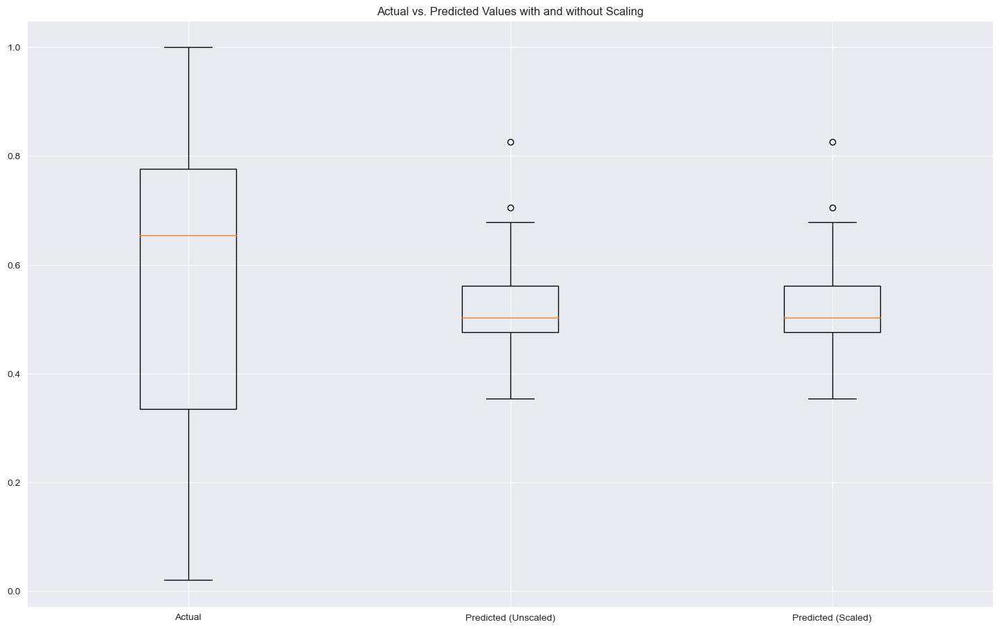

In [48]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# Assume X_train, y_train, X_test, y_test are your training and testing data
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Linear Regression model
linear_reg_model = LinearRegression()

# Train the model on the unscaled features
linear_reg_model.fit(X_train, y_train)

# Make predictions on the unscaled test set
y_pred_unscaled = linear_reg_model.predict(X_test)

# Evaluate the model on the unscaled test set
rmse_unscaled = np.sqrt(mean_squared_error(y_test, y_pred_unscaled))
print(f"RMSE without scaling: {rmse_unscaled}")

# Apply standard scaling to the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train the Linear Regression model on the scaled features
linear_reg_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_scaled = linear_reg_model.predict(X_test_scaled)

# Evaluate the model on the scaled test set
rmse_scaled = np.sqrt(mean_squared_error(y_test, y_pred_scaled))
print(f"RMSE with scaling: {rmse_scaled}")

# Visualize the distribution of predicted vs. actual values
plt.boxplot([y_test, y_pred_unscaled, y_pred_scaled], labels=['Actual', 'Predicted (Unscaled)', 'Predicted (Scaled)'])
plt.title('Actual vs. Predicted Values with and without Scaling')
plt.show()


RMSE without scaling: 0.2556707514378652
RMSE with scaling: 0.25567075143786505


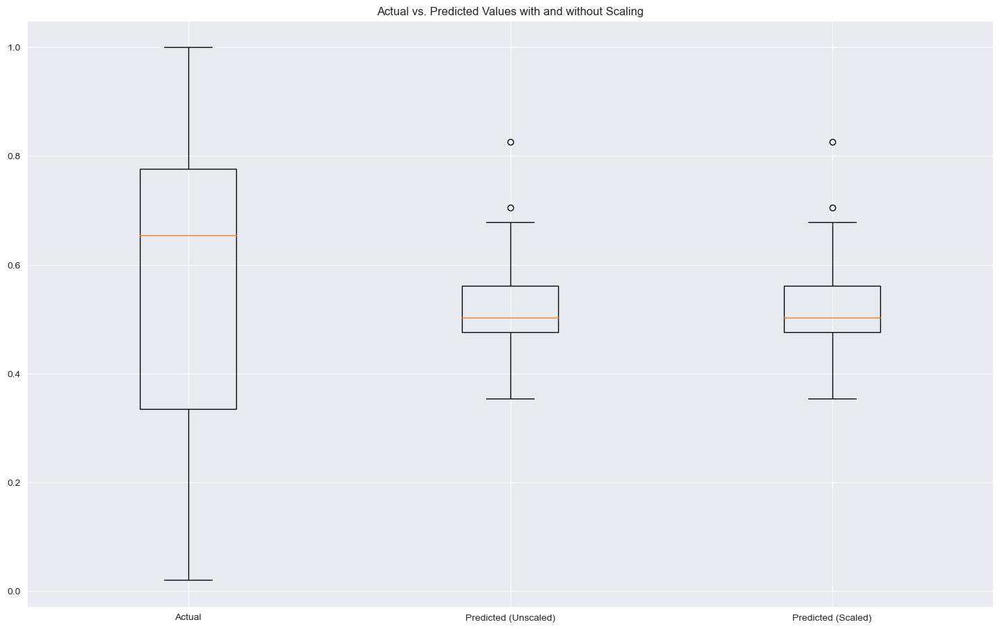

Cross-Validated RMSE without scaling: 0.2631685096109829
Cross-Validated RMSE with scaling: 0.2631685096109819


In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# Assume X_train, y_train, X_test, y_test are your training and testing data
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Linear Regression model
linear_reg_model = LinearRegression()

# Train the model on the unscaled features
linear_reg_model.fit(X_train, y_train)

# Make predictions on the unscaled test set
y_pred_unscaled = linear_reg_model.predict(X_test)

# Evaluate the model on the unscaled test set
rmse_unscaled = np.sqrt(mean_squared_error(y_test, y_pred_unscaled))
print(f"RMSE without scaling: {rmse_unscaled}")

# Apply Min-Max scaling to the features
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train the Linear Regression model on the scaled features
linear_reg_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_scaled = linear_reg_model.predict(X_test_scaled)

# Evaluate the model on the scaled test set
rmse_scaled = np.sqrt(mean_squared_error(y_test, y_pred_scaled))
print(f"RMSE with scaling: {rmse_scaled}")

# Visualize the distribution of predicted vs. actual values
plt.boxplot([y_test, y_pred_unscaled, y_pred_scaled], labels=['Actual', 'Predicted (Unscaled)', 'Predicted (Scaled)'])
plt.title('Actual vs. Predicted Values with and without Scaling')
plt.show()

# Cross-validation for comparison
cv_scores_unscaled = np.sqrt(-cross_val_score(linear_reg_model, X, y, cv=5, scoring='neg_mean_squared_error'))
cv_scores_scaled = np.sqrt(-cross_val_score(linear_reg_model, scaler.transform(X), y, cv=5, scoring='neg_mean_squared_error'))

print(f"Cross-Validated RMSE without scaling: {cv_scores_unscaled.mean()}")
print(f"Cross-Validated RMSE with scaling: {cv_scores_scaled.mean()}")


In [50]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Load your preprocessed data
# Assuming your data is in a DataFrame called 'preprocessed'

# Feature Selection: Keep only relevant features
selected_features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Negative Sentiment', '# Of Words', 'Average Word Length', 'Average Sentence Length']
X = preprocessed[selected_features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Linear Regression model
linear_reg_model = LinearRegression()

# Train the model
linear_reg_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = linear_reg_model.predict(X_test)

# Evaluate the model
rmse_original = np.sqrt(mean_squared_error(y_test, y_pred))
print("Original RMSE:", rmse_original)

# Outlier Removal: Remove outliers from training set
outlier_threshold = 2  # Adjust as needed
residuals = y_train - linear_reg_model.predict(X_train)
outliers = abs(residuals) > outlier_threshold
X_train_no_outliers = X_train[~outliers]
y_train_no_outliers = y_train[~outliers]

# Train the model without outliers
linear_reg_model_no_outliers = LinearRegression()
linear_reg_model_no_outliers.fit(X_train_no_outliers, y_train_no_outliers)

# Make predictions on the test set without outliers
y_pred_no_outliers = linear_reg_model_no_outliers.predict(X_test)

# Evaluate the model without outliers
rmse_no_outliers = np.sqrt(mean_squared_error(y_test, y_pred_no_outliers))
print("RMSE after Outlier Removal:", rmse_no_outliers)

# Non-linear Transformation: Apply logarithmic transformation to a feature
X_train_log_transformed = X_train.copy()
X_train_log_transformed['Positive Sentiment'] = np.log1p(X_train_log_transformed['Positive Sentiment'])

# Train the model with the transformed feature
linear_reg_model_log_transformed = LinearRegression()
linear_reg_model_log_transformed.fit(X_train_log_transformed, y_train)

# Transform the test set for prediction
X_test_log_transformed = X_test.copy()
X_test_log_transformed['Positive Sentiment'] = np.log1p(X_test_log_transformed['Positive Sentiment'])
y_pred_log_transformed = linear_reg_model_log_transformed.predict(X_test_log_transformed)

# Evaluate the model with the transformed feature
rmse_log_transformed = np.sqrt(mean_squared_error(y_test, y_pred_log_transformed))
print("RMSE after Logarithmic Transformation:", rmse_log_transformed)

# Interaction Terms: Create an interaction term between two features
X_train_interaction = X_train.copy()
X_train_interaction['Interaction Term'] = X_train['number_of_verses'] * X_train['number_of_chorus']

# Train the model with the interaction term
linear_reg_model_interaction = LinearRegression()
linear_reg_model_interaction.fit(X_train_interaction, y_train)

# Transform the test set for prediction
X_test_interaction = X_test.copy()
X_test_interaction['Interaction Term'] = X_test['number_of_verses'] * X_test['number_of_chorus']
y_pred_interaction = linear_reg_model_interaction.predict(X_test_interaction)

# Evaluate the model with the interaction term
rmse_interaction = np.sqrt(mean_squared_error(y_test, y_pred_interaction))
print("RMSE after Adding Interaction Term:", rmse_interaction)


Original RMSE: 0.25245414598170984
RMSE after Outlier Removal: 0.25245414598170984
RMSE after Logarithmic Transformation: 0.252510419247071
RMSE after Adding Interaction Term: 0.2519263668092332


Cross-Validated RMSE: 0.22463909259703643
RMSE with Best Hyperparameters: 0.2447844604314878


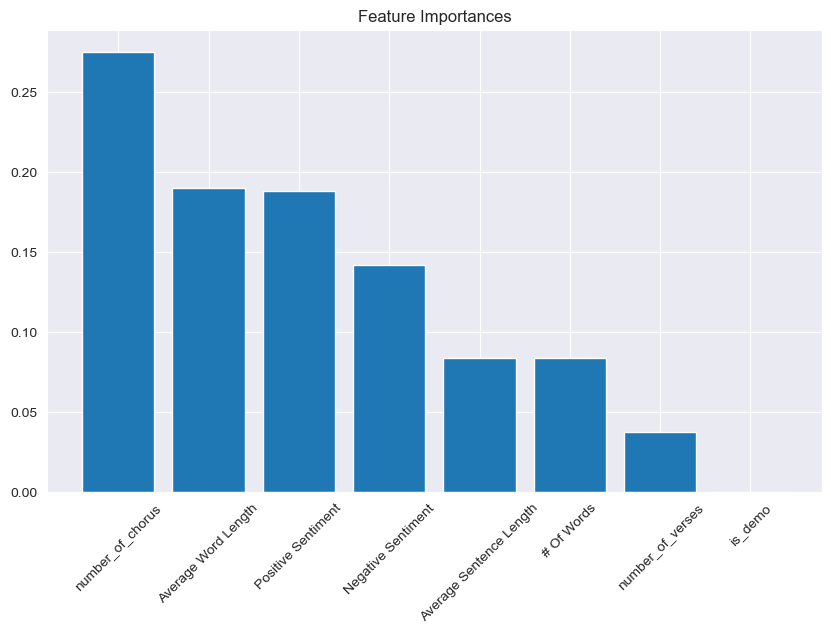

In [55]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Load your preprocessed data
# Assuming your data is in a DataFrame called 'preprocessed'

# Feature Engineering: Select relevant features
selected_features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Negative Sentiment', '# Of Words', 'Average Word Length', 'Average Sentence Length']
X = preprocessed[selected_features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Regressor model
rf_regressor = RandomForestRegressor(random_state=42)

# Cross-Validation: Evaluate the model using cross-validation
cv_scores = cross_val_score(rf_regressor, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
rmse_cv = np.sqrt(-cv_scores.mean())
print("Cross-Validated RMSE:", rmse_cv)

# Hyperparameter Tuning using Grid Search
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=rf_regressor, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train the model with the best hyperparameters
best_rf_regressor = RandomForestRegressor(**best_params, random_state=42)
best_rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred = best_rf_regressor.predict(X_test)

# Evaluate the model with the best hyperparameters
rmse_best_model = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE with Best Hyperparameters:", rmse_best_model)

# Visualize Feature Importances
feature_importances = best_rf_regressor.feature_importances_
feature_names = X.columns

# Sort feature importances in descending order
indices = np.argsort(feature_importances)[::-1]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), feature_importances[indices], align="center")
plt.xticks(range(X.shape[1]), feature_names[indices], rotation=45)
plt.title("Feature Importances")
plt.show()


In [59]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming X and y are your feature matrix and target variable
selected_features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Negative Sentiment', '# Of Words', 'Average Word Length', 'Average Sentence Length']
X = preprocessed[selected_features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform on training data
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test data using the same scaler
X_test_scaled = scaler.transform(X_test)

# Initialize Random Forest Regressor
rf_regressor = RandomForestRegressor()

# Fit the model on scaled training data
rf_regressor.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
y_pred_scaled = rf_regressor.predict(X_test_scaled)

# Evaluate the model using RMSE
rmse_scaled = mean_squared_error(y_test, y_pred_scaled, squared=False)
print(f"RMSE with MinMaxScaler: {rmse_scaled}")


RMSE with MinMaxScaler: 0.24868827827185827


In [64]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
import matplotlib.pyplot as plt
import numpy as np

# Assuming X and y are your feature matrix and target variable
selected_features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Negative Sentiment', '# Of Words', 'Average Word Length', 'Average Sentence Length']
X = preprocessed[selected_features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Gradient Boosting Regressor
gb_regressor = GradientBoostingRegressor()

# Fit the model on training data
gb_regressor.fit(X_train, y_train)

# Make predictions on the test data
y_pred = gb_regressor.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

# Print the metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2): {r2}")
print(f"Explained Variance Score (EVS): {evs}")

# Visualize feature importances
feature_importances = gb_regressor.feature_importances_

# Make sure the number of features matches the length of feature importances
assert len(selected_features) == len(feature_importances), "Number of features and feature importances do not match"



Mean Squared Error (MSE): 0.06181947501595438
Root Mean Squared Error (RMSE): 0.24863522480926628
Mean Absolute Error (MAE): 0.20048633435983684
R-squared (R2): 0.1903555976632466
Explained Variance Score (EVS): 0.19617110072824073


In [71]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
import numpy as np

# Assume X and y are your feature matrix and target variable
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature Engineering: Polynomial Features
degree = 2  # You can experiment with different degrees
polyreg = make_pipeline(PolynomialFeatures(degree), StandardScaler(), SVR())

# Hyperparameter Tuning with GridSearchCV
param_grid = {
    'svr__C': [0.1, 1, 10],
    'svr__kernel': ['linear', 'rbf', 'poly'],
    'svr__degree': [2, 3, 4],
    'svr__gamma': ['scale', 'auto'],
}

grid_search = GridSearchCV(polyreg, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Best hyperparameters from the grid search
best_params = grid_search.best_params_

# Evaluate the tuned SVR model
y_pred_svr_tuned = grid_search.predict(X_test)

# Calculate regression metrics for the tuned SVR model
mse_svr_tuned = mean_squared_error(y_test, y_pred_svr_tuned)
rmse_svr_tuned = np.sqrt(mse_svr_tuned)
mae_svr_tuned = mean_absolute_error(y_test, y_pred_svr_tuned)
r2_svr_tuned = r2_score(y_test, y_pred_svr_tuned)
evs_svr_tuned = explained_variance_score(y_test, y_pred_svr_tuned)

# Print the regression metrics for the tuned SVR model
print('Best Hyperparameters:', best_params)
print(f'Mean Squared Error (MSE) - Tuned SVR: {mse_svr_tuned}')
print(f'Root Mean Squared Error (RMSE) - Tuned SVR: {rmse_svr_tuned}')
print(f'Mean Absolute Error (MAE) - Tuned SVR: {mae_svr_tuned}')
print(f'R-squared (R2) - Tuned SVR: {r2_svr_tuned}')
print(f'Explained Variance Score (EVS) - Tuned SVR: {evs_svr_tuned}')



Best Hyperparameters: {'svr__C': 0.1, 'svr__degree': 2, 'svr__gamma': 'auto', 'svr__kernel': 'rbf'}
Mean Squared Error (MSE) - Tuned SVR: 0.05902340160309899
Root Mean Squared Error (RMSE) - Tuned SVR: 0.24294732269176994
Mean Absolute Error (MAE) - Tuned SVR: 0.20577737693952222
R-squared (R2) - Tuned SVR: 0.2269755331553669
Explained Variance Score (EVS) - Tuned SVR: 0.22935550186125941


In [72]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
import numpy as np

# Assume X and y are your feature matrix and target variable
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Neural Network model
nn_model = MLPRegressor(max_iter=1000)  # You can adjust max_iter based on your dataset

# Hyperparameter Tuning with GridSearchCV
param_grid = {
    'hidden_layer_sizes': [(50, 50), (100,)],
    'activation': ['relu', 'tanh'],
    'alpha': [0.0001, 0.001, 0.01],
}

grid_search = GridSearchCV(nn_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

# Best hyperparameters from the grid search
best_params = grid_search.best_params_

# Evaluate the tuned Neural Network model
y_pred_nn_tuned = grid_search.predict(X_test_scaled)

# Calculate regression metrics for the tuned Neural Network model
mse_nn_tuned = mean_squared_error(y_test, y_pred_nn_tuned)
rmse_nn_tuned = np.sqrt(mse_nn_tuned)
mae_nn_tuned = mean_absolute_error(y_test, y_pred_nn_tuned)
r2_nn_tuned = r2_score(y_test, y_pred_nn_tuned)
evs_nn_tuned = explained_variance_score(y_test, y_pred_nn_tuned)

# Print the regression metrics for the tuned Neural Network model
print('Best Hyperparameters:', best_params)
print(f'Mean Squared Error (MSE) - Tuned Neural Network: {mse_nn_tuned}')
print(f'Root Mean Squared Error (RMSE) - Tuned Neural Network: {rmse_nn_tuned}')
print(f'Mean Absolute Error (MAE) - Tuned Neural Network: {mae_nn_tuned}')
print(f'R-squared (R2) - Tuned Neural Network: {r2_nn_tuned}')
print(f'Explained Variance Score (EVS) - Tuned Neural Network: {evs_nn_tuned}')


Best Hyperparameters: {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50)}
Mean Squared Error (MSE) - Tuned Neural Network: 0.05851129535787485
Root Mean Squared Error (RMSE) - Tuned Neural Network: 0.24189108160053122
Mean Absolute Error (MAE) - Tuned Neural Network: 0.20535369946811
R-squared (R2) - Tuned Neural Network: 0.23368254505963182
Explained Variance Score (EVS) - Tuned Neural Network: 0.23398199066746317


# Task 6

Original Liner regression model Mean Squared Error (MSE): 0.06257951939060671
Original Liner regression model Root Mean Squared Error (RMSE): 0.25015898822670096
Original Liner regression modelMean Absolute Error (MAE): 0.1970923563317287
Original Liner regression modelR-squared (R2) Score: 0.1804013611818468
Mean Squared Error (MSE) - Polynomial Regression: 0.0601
Root Mean Squared Error (RMSE) - Polynomial Regression: 0.2452
Mean Absolute Error (MAE) - Polynomial Regression: 0.2047
R-squared (R2) - Polynomial Regression: 0.2127


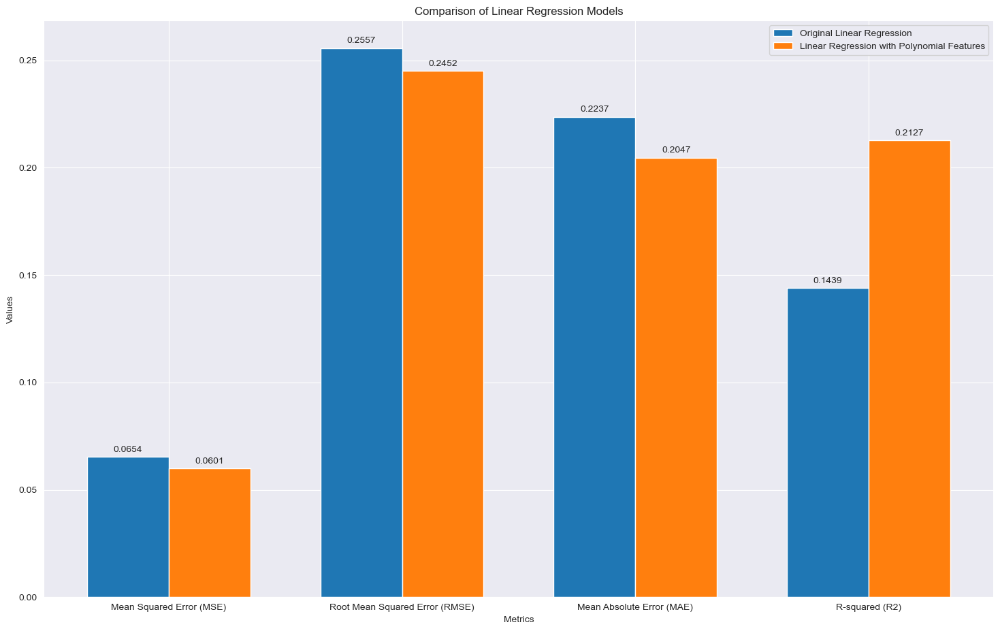

In [150]:
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Linear Regression model
linear_reg_model_Original = LinearRegression()

# Train the Linear Regression model
linear_reg_model_Original.fit(X_train, y_train)

# Make predictions on the test set
y_pred = linear_reg_model_Original.predict(X_test)



# Print the results
print(f'Original Liner regression model Mean Squared Error (MSE): {mse}')
print(f'Original Liner regression model Root Mean Squared Error (RMSE): {rmse}')
print(f'Original Liner regression modelMean Absolute Error (MAE): {mae}')
print(f'Original Liner regression modelR-squared (R2) Score: {r2}')


# Feature Engineering: Polynomial Features
degree = 2  # You can experiment with different degrees
polyreg = make_pipeline(PolynomialFeatures(degree), LinearRegression())
polyreg.fit(X_train, y_train)

# Make predictions on the test set
y_pred_poly = polyreg.predict(X_test)



# Calculate performance metrics for the original Linear Regression model
mse_original = mean_squared_error(y_test, y_pred)
rmse_original = np.sqrt(mse_original)
mae_original = mean_absolute_error(y_test, y_pred)
r2_original = r2_score(y_test, y_pred)

# Calculate performance metrics for the Linear Regression model with polynomial features
mse_poly = mean_squared_error(y_test, y_pred_poly)
rmse_poly = np.sqrt(mse_poly)
mae_poly = mean_absolute_error(y_test, y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)

# Print the performance metrics
print(f'Mean Squared Error (MSE) - Polynomial Regression: {mse_poly:.4f}')
print(f'Root Mean Squared Error (RMSE) - Polynomial Regression: {rmse_poly:.4f}')
print(f'Mean Absolute Error (MAE) - Polynomial Regression: {mae_poly:.4f}')
print(f'R-squared (R2) - Polynomial Regression: {r2_poly:.4f}')

# Create a bar graph to compare metrics
metrics = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
original_values = [mse_original, rmse_original, mae_original, r2_original]
poly_values = [mse_poly, rmse_poly, mae_poly, r2_poly]

bar_width = 0.35
index = np.arange(len(metrics))

fig, ax = plt.subplots()
bar1 = ax.bar(index, original_values, bar_width, label='Original Linear Regression')
bar2 = ax.bar(index + bar_width, poly_values, bar_width, label='Linear Regression with Polynomial Features')

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Comparison of Linear Regression Models')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()

# Display the values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

plt.show()



Original Linear Regression Model Metrics:
Mean Squared Error (MSE): 0.06536753314080267
Root Mean Squared Error (RMSE): 0.2556707514378652
Mean Absolute Error (MAE): 0.22370474766007137
R-squared (R2) Score: 0.1438869824055553
Linear Regression Model with Min/Max Scaling Metrics:
Mean Squared Error (MSE): 0.06536753314080257
Root Mean Squared Error (RMSE): 0.25567075143786505
Mean Absolute Error (MAE): 0.22370474766007073
R-squared (R2) Score: 0.14388698240555653


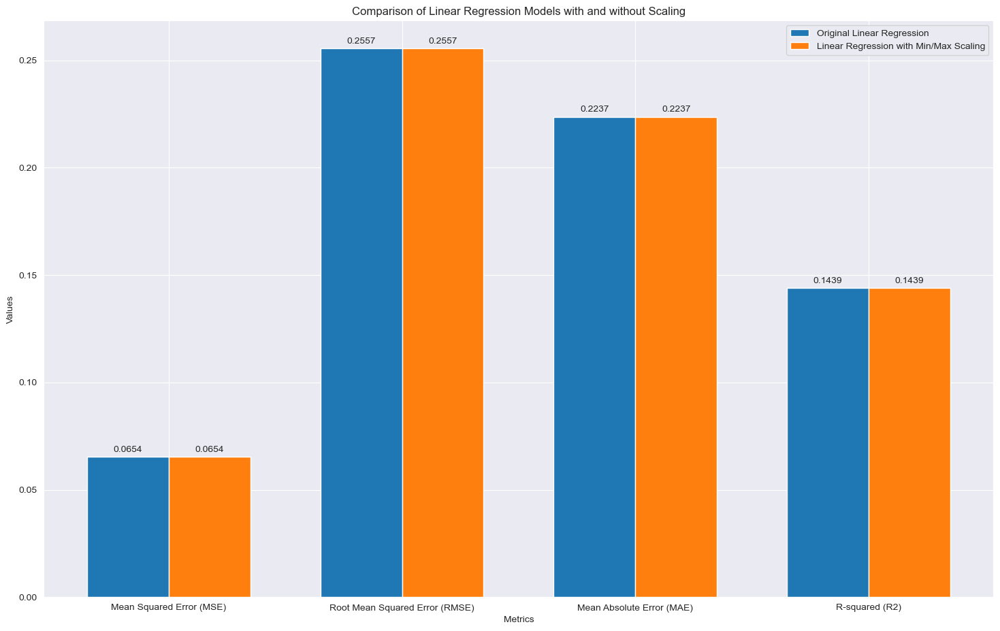

In [151]:
from sklearn.preprocessing import MinMaxScaler

# Initialize Linear Regression model for original data
linear_reg_model_original = LinearRegression()

# Train the Linear Regression model on original data
linear_reg_model_original.fit(X_train, y_train)

# Make predictions on the test set
y_pred_original = linear_reg_model_original.predict(X_test)

# Calculate performance metrics for the original Linear Regression model
mse_original = mean_squared_error(y_test, y_pred_original)
rmse_original = np.sqrt(mse_original)
mae_original = mean_absolute_error(y_test, y_pred_original)
r2_original = r2_score(y_test, y_pred_original)

# Print the metrics
print("Original Linear Regression Model Metrics:")
print(f"Mean Squared Error (MSE): {mse_original}")
print(f"Root Mean Squared Error (RMSE): {rmse_original}")
print(f"Mean Absolute Error (MAE): {mae_original}")
print(f"R-squared (R2) Score: {r2_original}")

# Create a bar graph to compare metrics for the original Linear Regression model
metrics_original = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
original_values = [mse_original, rmse_original, mae_original, r2_original]

# Min/Max Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize Linear Regression model for scaled data
linear_reg_model_scaled = LinearRegression()

# Train the Linear Regression model on scaled data
linear_reg_model_scaled.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_scaled = linear_reg_model_scaled.predict(X_test_scaled)

# Calculate performance metrics for the Linear Regression model with Min/Max Scaling
mse_scaled = mean_squared_error(y_test, y_pred_scaled)
rmse_scaled = np.sqrt(mse_scaled)
mae_scaled = mean_absolute_error(y_test, y_pred_scaled)
r2_scaled = r2_score(y_test, y_pred_scaled)

# Print the metrics
print("Linear Regression Model with Min/Max Scaling Metrics:")
print(f"Mean Squared Error (MSE): {mse_scaled}")
print(f"Root Mean Squared Error (RMSE): {rmse_scaled}")
print(f"Mean Absolute Error (MAE): {mae_scaled}")
print(f"R-squared (R2) Score: {r2_scaled}")

# Create a bar graph to compare metrics for the Linear Regression model with Min/Max Scaling
metrics_scaled = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
scaled_values = [mse_scaled, rmse_scaled, mae_scaled, r2_scaled]

# Plotting
bar_width = 0.35
index = np.arange(len(metrics_original))

fig, ax = plt.subplots()
bar1 = ax.bar(index, original_values, bar_width, label='Original Linear Regression')
bar2 = ax.bar(index + bar_width, scaled_values, bar_width, label='Linear Regression with Min/Max Scaling')

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Comparison of Linear Regression Models with and without Scaling')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics_original)
ax.legend()

# Display the values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

plt.show()


Original Linear Regression Model Metrics:
Mean Squared Error (MSE): 0.0654
Root Mean Squared Error (RMSE): 0.2557
Mean Absolute Error (MAE): 0.2237
R-squared (R2) Score: 0.1439
Mean Cross-Validation MSE: 0.0497
Mean Cross-Validation RMSE: 0.2213
Mean Cross-Validation MAE: -0.1804
Mean Cross-Validation R2: 0.1081


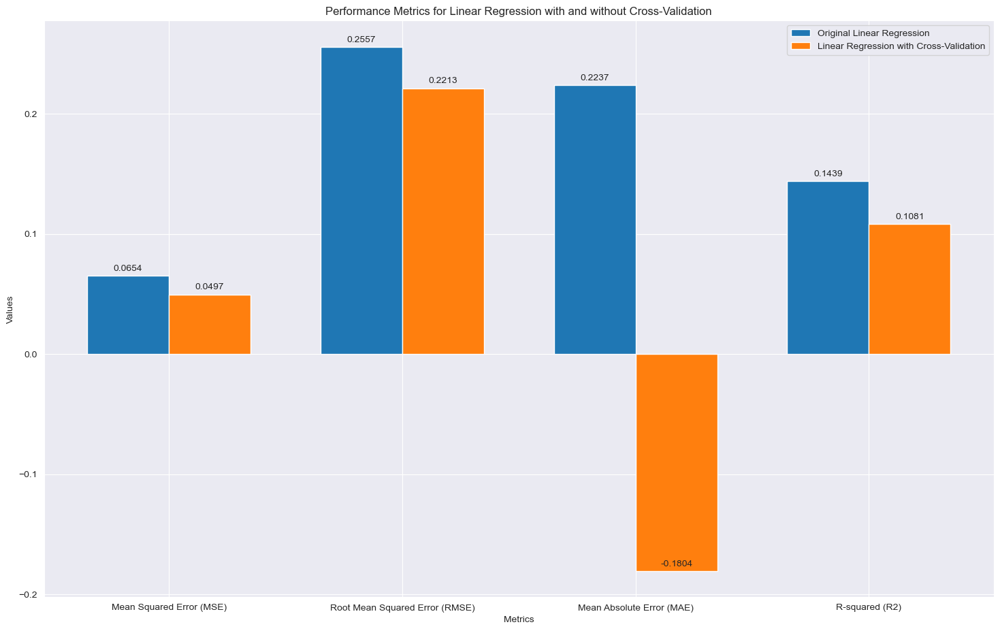

In [124]:
from sklearn.model_selection import cross_val_score

# Initialize Linear Regression model for original data
linear_reg_model_original = LinearRegression()

# Train the Linear Regression model on original data
linear_reg_model_original.fit(X_train, y_train)

# Make predictions on the test set
y_pred_original = linear_reg_model_original.predict(X_test)

# Calculate performance metrics for the original Linear Regression model
mse_original = mean_squared_error(y_test, y_pred_original)
rmse_original = np.sqrt(mse_original)
mae_original = mean_absolute_error(y_test, y_pred_original)
r2_original = r2_score(y_test, y_pred_original)

# Print the metrics
print(f'Original Linear Regression Model Metrics:')
print(f'Mean Squared Error (MSE): {mse_original:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_original:.4f}')
print(f'Mean Absolute Error (MAE): {mae_original:.4f}')
print(f'R-squared (R2) Score: {r2_original:.4f}')

# Create a bar graph to compare metrics for the original Linear Regression model
metrics_original = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
original_values = [mse_original, rmse_original, mae_original, r2_original]

# Cross-Validation
cv_scores = cross_val_score(linear_reg_model_original, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_original = np.sqrt(-cv_scores)
cv_mse_original = -cv_scores  # Use positive mean squared error for comparison
cv_mae_original = cross_val_score(linear_reg_model_original, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_r2_original = cross_val_score(linear_reg_model_original, X_train, y_train, cv=5, scoring='r2')

# Calculate mean values for cross-validation metrics
cv_mse_mean = np.mean(cv_mse_original)
cv_rmse_mean = np.mean(cv_rmse_original)
cv_mae_mean = np.mean(cv_mae_original)
cv_r2_mean = np.mean(cv_r2_original)

# Print the mean values
print(f'Mean Cross-Validation MSE: {cv_mse_mean:.4f}')
print(f'Mean Cross-Validation RMSE: {cv_rmse_mean:.4f}')
print(f'Mean Cross-Validation MAE: {cv_mae_mean:.4f}')
print(f'Mean Cross-Validation R2: {cv_r2_mean:.4f}')

# Create a bar graph to compare metrics for the Linear Regression model with Cross-Validation
metrics_cv = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
cv_values = [cv_mse_mean, cv_rmse_mean, cv_mae_mean, cv_r2_mean]

# Plotting
bar_width = 0.35
index = np.arange(len(metrics_cv))

fig, ax = plt.subplots()
bar1 = ax.bar(index, original_values, bar_width, label='Original Linear Regression')  # Bar for original model
bar2 = ax.bar(index + bar_width, cv_values, bar_width, label='Linear Regression with Cross-Validation')  # Bar for cross-validation model

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Performance Metrics for Linear Regression with and without Cross-Validation')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics_cv)
ax.legend()

# Display the values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

plt.show()

Original Linear Regression Model Metrics:
Mean Squared Error (MSE): 0.0654
Root Mean Squared Error (RMSE): 0.2557
Mean Absolute Error (MAE): 0.2237
R-squared (R2) Score: 0.1439
Mean Squared Error (MSE) - Linear Regression model with Grid Search: 0.0681
Root Mean Squared Error (RMSE) - Linear Regression model with Grid Search: 0.2609
R-squared (R2) - Linear Regression model with Grid Search: 0.1084
Mean Absolute Error (MAE) - Linear Regression model with Grid Search: 0.2091


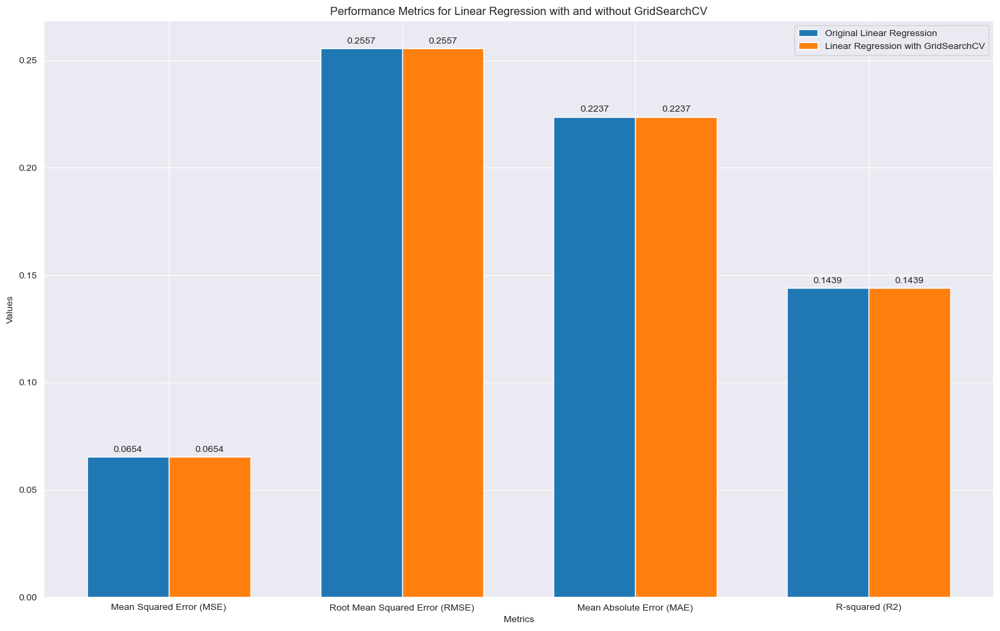

In [126]:
from sklearn.model_selection import GridSearchCV

# 1. Train the original Linear Regression model
linear_reg_model_original = LinearRegression()
linear_reg_model_original.fit(X_train, y_train)

# Make predictions on the test set
y_pred_original = linear_reg_model_original.predict(X_test)

# Calculate performance metrics for the original Linear Regression model
mse_original = mean_squared_error(y_test, y_pred_original)
rmse_original = np.sqrt(mse_original)
mae_original = mean_absolute_error(y_test, y_pred_original)
r2_original = r2_score(y_test, y_pred_original)

# Print the performance metrics
print(f'Original Linear Regression Model Metrics:')
print(f'Mean Squared Error (MSE): {mse_original:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_original:.4f}')
print(f'Mean Absolute Error (MAE): {mae_original:.4f}')
print(f'R-squared (R2) Score: {r2_original:.4f}')

# Create a bar graph to compare metrics for the original Linear Regression model
metrics_original = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
original_values = [mse_original, rmse_original, mae_original, r2_original]

# 2. Train a new Linear Regression model using GridSearchCV
param_grid = {'fit_intercept': [True, False], 'copy_X': [True, False]}
grid_search_model = GridSearchCV(LinearRegression(), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search_model.fit(X_train, y_train)

# Get the best model from GridSearchCV
best_linear_reg_model = grid_search_model.best_estimator_

# Make predictions on the test set using the best model
y_pred_grid_search = best_linear_reg_model.predict(X_test)

# Calculate performance metrics for the Linear Regression model with GridSearchCV
mse_grid_search = mean_squared_error(y_test, y_pred_grid_search)
rmse_grid_search = np.sqrt(mse_grid_search)
mae_grid_search = mean_absolute_error(y_test, y_pred_grid_search)
r2_grid_search = r2_score(y_test, y_pred_grid_search)

# Print the regression metrics for the Neural Network with GridSearchCV
print(f'Mean Squared Error (MSE) - Linear Regression model with Grid Search: {mse_gridsearch:.4f}')
print(f'Root Mean Squared Error (RMSE) - Linear Regression model with Grid Search: {rmse_gridsearch:.4f}')
print(f'R-squared (R2) - Linear Regression model with Grid Search: {r2_gridsearch:.4f}')
print(f'Mean Absolute Error (MAE) - Linear Regression model with Grid Search: {mae_gridsearch:.4f}')

# Create a bar graph to compare metrics for the Linear Regression model with GridSearchCV
grid_search_values = [mse_grid_search, rmse_grid_search, mae_grid_search, r2_grid_search]

# Plotting
fig, ax = plt.subplots()
bar1 = ax.bar(index, original_values, bar_width, label='Original Linear Regression')  # Bar for original model
bar2 = ax.bar(index + bar_width, grid_search_values, bar_width, label='Linear Regression with GridSearchCV')  # Bar for GridSearchCV model

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Performance Metrics for Linear Regression with and without GridSearchCV')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics_original)
ax.legend()

# Display the values on top of the bars
add_labels(bar1)
add_labels(bar2)

plt.show()



Random Forest Regressor Mean Squared Error (MSE): 0.0627
Random Forest Regressor Root Mean Squared Error (RMSE): 0.2504
Random Forest Regressor Mean Absolute Error (MAE): 0.2068
Random Forest Regressor R-squared (R2) Score: 0.1787

Random Forest Regressor with Polynomial Features:
Mean Squared Error (MSE): 0.0558
Root Mean Squared Error (RMSE): 0.2362
Mean Absolute Error (MAE): 0.2034
R-squared (R2) Score: 0.2693


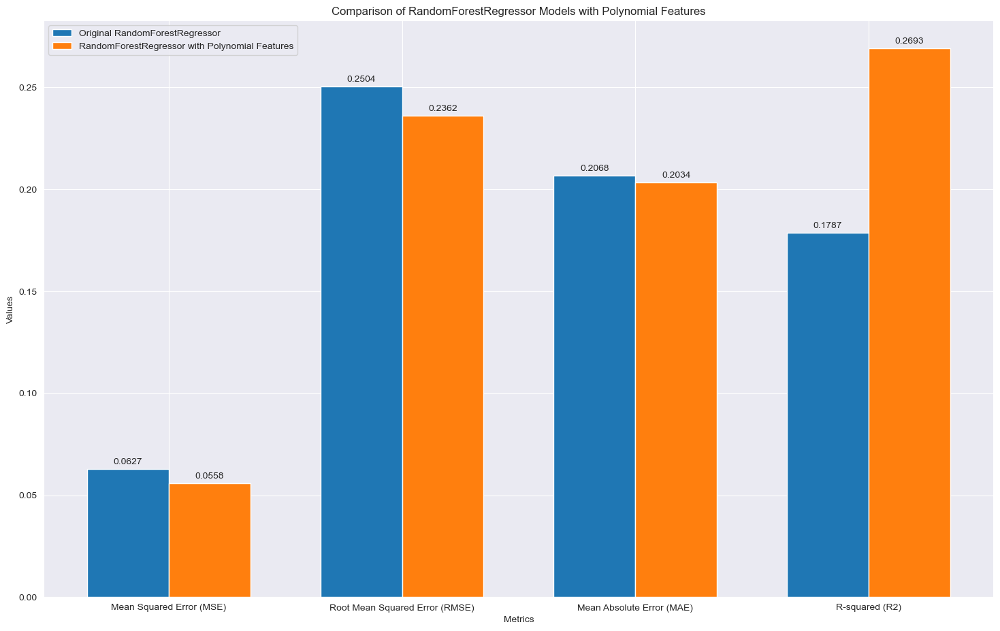

In [127]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Train the Random Forest Regressor on the training set
rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_regressor.predict(X_test)

# Calculate Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, y_pred_rf)

# Calculate Root Mean Squared Error (RMSE)
rmse_rf = np.sqrt(mse_rf)

# Calculate Mean Absolute Error (MAE)
mae_rf = mean_absolute_error(y_test, y_pred_rf)

# Calculate R-squared (R2) Score
r2_rf = r2_score(y_test, y_pred_rf)

# Print the results
print(f'Random Forest Regressor Mean Squared Error (MSE): {mse_rf:.4f}')
print(f'Random Forest Regressor Root Mean Squared Error (RMSE): {rmse_rf:.4f}')
print(f'Random Forest Regressor Mean Absolute Error (MAE): {mae_rf:.4f}')
print(f'Random Forest Regressor R-squared (R2) Score: {r2_rf:.4f}')

# Feature Engineering: Polynomial Features
degree = 2  # You can experiment with different degrees
polyreg_rf = make_pipeline(PolynomialFeatures(degree), RandomForestRegressor(random_state=42))
polyreg_rf.fit(X_train, y_train)

# Make predictions on the test set with Polynomial Features
y_pred_rf_poly = polyreg_rf.predict(X_test)

# Calculate performance metrics for the Random Forest Regressor with Polynomial Features
mse_rf_poly = mean_squared_error(y_test, y_pred_rf_poly)
rmse_rf_poly = np.sqrt(mse_rf_poly)
mae_rf_poly = mean_absolute_error(y_test, y_pred_rf_poly)
r2_rf_poly = r2_score(y_test, y_pred_rf_poly)

# Print the results for Polynomial Features
print('\nRandom Forest Regressor with Polynomial Features:')
print(f'Mean Squared Error (MSE): {mse_rf_poly:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_rf_poly:.4f}')
print(f'Mean Absolute Error (MAE): {mae_rf_poly:.4f}')
print(f'R-squared (R2) Score: {r2_rf_poly:.4f}')

# Metrics for the original RandomForestRegressor
original_metrics_rf = [mse_rf, rmse_rf, mae_rf, r2_rf]

# Metrics for the RandomForestRegressor with Polynomial Features
poly_metrics_rf = [mse_rf_poly, rmse_rf_poly, mae_rf_poly, r2_rf_poly]

# Bar graph setup
metrics_labels = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width = 0.35
index = np.arange(len(metrics_labels))

# Plotting
fig, ax = plt.subplots()
bar1 = ax.bar(index, original_metrics_rf, bar_width, label='Original RandomForestRegressor')
bar2 = ax.bar(index + bar_width, poly_metrics_rf, bar_width, label='RandomForestRegressor with Polynomial Features')

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Comparison of RandomForestRegressor Models with Polynomial Features')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics_labels)
ax.legend()

# Display the values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

plt.show()

Random Forest Regressor Mean Squared Error (MSE): 0.0627
Random Forest Regressor Root Mean Squared Error (RMSE): 0.2504
Random Forest Regressor Mean Absolute Error (MAE): 0.2068
Random Forest Regressor R-squared (R2) Score: 0.1787
Mean Squared Error (MSE) - Random Forest Regressor with Scaling: 0.0634
Root Mean Squared Error (RMSE) - Random Forest Regressor with Scaling: 0.2518
Mean Absolute Error (MAE) - Random Forest Regressor with Scaling: 0.2082
R-squared (R2) - Random Forest Regressor with Scaling: 0.1698


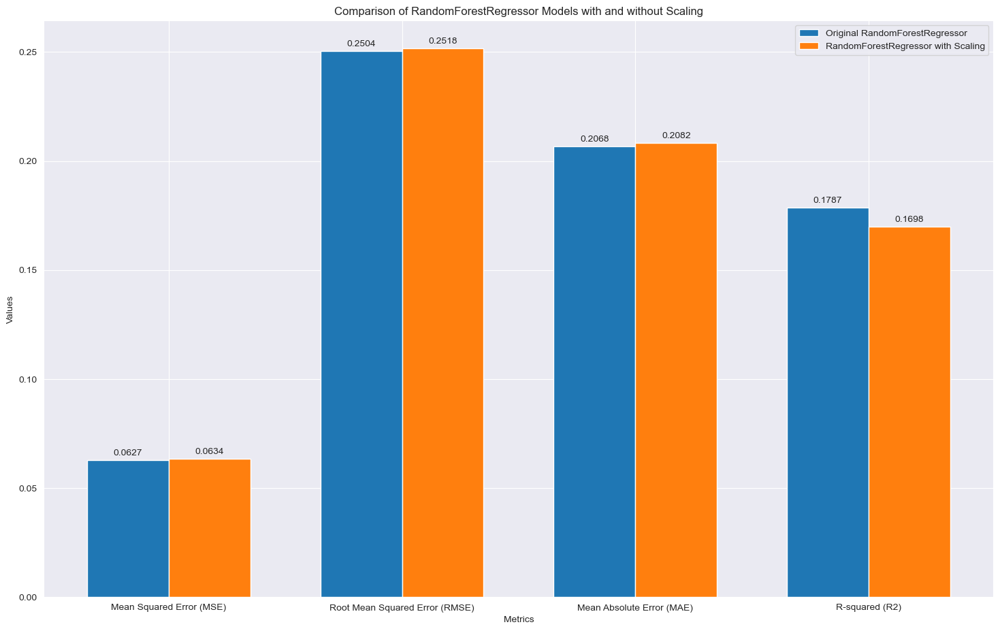

In [128]:
# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Train the Random Forest Regressor on the training set
rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_regressor.predict(X_test)

# Calculate Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, y_pred_rf)

# Calculate Root Mean Squared Error (RMSE)
rmse_rf = np.sqrt(mse_rf)

# Calculate Mean Absolute Error (MAE)
mae_rf = mean_absolute_error(y_test, y_pred_rf)

# Calculate R-squared (R2) Score
r2_rf = r2_score(y_test, y_pred_rf)

# Print the results
print(f'Random Forest Regressor Mean Squared Error (MSE): {mse_rf:.4f}')
print(f'Random Forest Regressor Root Mean Squared Error (RMSE): {rmse_rf:.4f}')
print(f'Random Forest Regressor Mean Absolute Error (MAE): {mae_rf:.4f}')
print(f'Random Forest Regressor R-squared (R2) Score: {r2_rf:.4f}')

# Min/Max Scaling
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize Random Forest Regressor model for scaled data
rf_regressor_scaled = RandomForestRegressor()

# Train the Random Forest Regressor model on scaled data
rf_regressor_scaled.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_scaled = rf_regressor_scaled.predict(X_test_scaled)

# Calculate performance metrics for the Random Forest Regressor model with Min/Max Scaling
mse_scaled = mean_squared_error(y_test, y_pred_scaled)
rmse_scaled = np.sqrt(mse_scaled)
mae_scaled = mean_absolute_error(y_test, y_pred_scaled)
r2_scaled = r2_score(y_test, y_pred_scaled)

# Print the regression metrics for the Random Forest Regressor with Min/Max Scaling
print(f'Mean Squared Error (MSE) - Random Forest Regressor with Scaling: {mse_scaled:.4f}')
print(f'Root Mean Squared Error (RMSE) - Random Forest Regressor with Scaling: {rmse_scaled:.4f}')
print(f'Mean Absolute Error (MAE) - Random Forest Regressor with Scaling: {mae_scaled:.4f}')
print(f'R-squared (R2) - Random Forest Regressor with Scaling: {r2_scaled:.4f}')

# Metrics for the original RandomForestRegressor
original_metrics_rf = [mse_rf, rmse_rf, mae_rf, r2_rf]

# Metrics for the RandomForestRegressor with Min/Max Scaling
scaled_metrics_rf = [mse_scaled, rmse_scaled, mae_scaled, r2_scaled]

# Bar graph setup
metrics_labels_rf = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_rf = 0.35
index_rf = np.arange(len(metrics_labels_rf))

# Plotting
fig_rf, ax_rf = plt.subplots()
bar1_rf = ax_rf.bar(index_rf, original_metrics_rf, bar_width_rf, label='Original RandomForestRegressor')
bar2_rf = ax_rf.bar(index_rf + bar_width_rf, scaled_metrics_rf, bar_width_rf, label='RandomForestRegressor with Scaling')

ax_rf.set_xlabel('Metrics')
ax_rf.set_ylabel('Values')
ax_rf.set_title('Comparison of RandomForestRegressor Models with and without Scaling')
ax_rf.set_xticks(index_rf + bar_width_rf / 2)
ax_rf.set_xticklabels(metrics_labels_rf)
ax_rf.legend()

# Display the values on top of the bars
def add_labels(bars, ax):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1_rf, ax_rf)
add_labels(bar2_rf, ax_rf)

plt.show()


Random Forest Regressor Mean Squared Error (MSE): 0.0627
Random Forest Regressor Root Mean Squared Error (RMSE): 0.2504
Random Forest Regressor Mean Absolute Error (MAE): 0.2068
Random Forest Regressor R-squared (R2) Score: 0.1787

Random Forest Regressor with Cross-Validation:
Mean Squared Error (MSE): 0.0515
Root Mean Squared Error (RMSE): 0.2259
Mean Absolute Error (MAE): -0.1803
R-squared (R2) Score: 0.0794


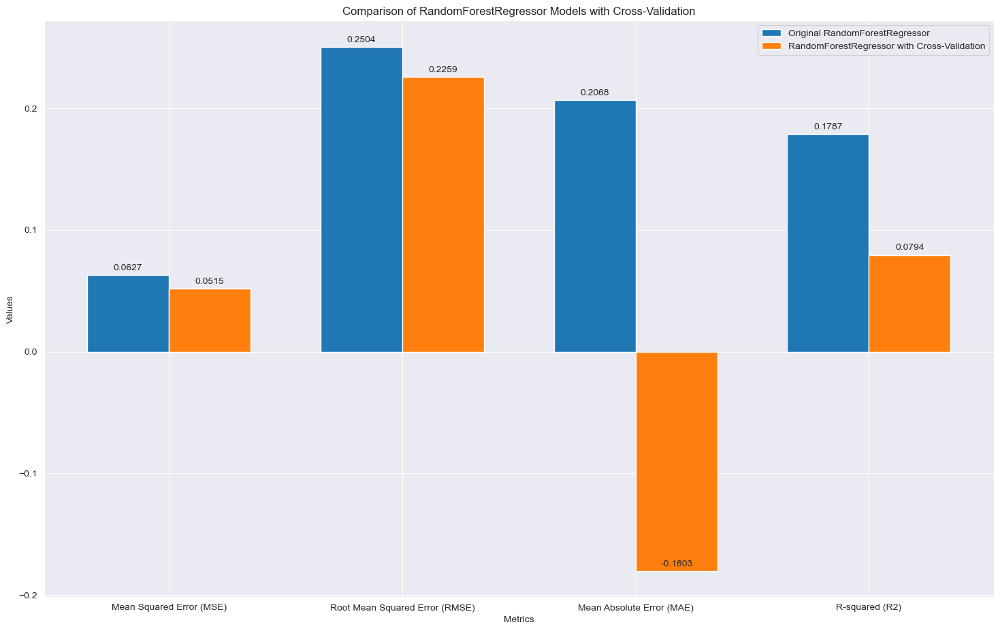

In [129]:
# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Train the Random Forest Regressor on the training set
rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_regressor.predict(X_test)

# Calculate Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, y_pred_rf)

# Calculate Root Mean Squared Error (RMSE)
rmse_rf = np.sqrt(mse_rf)

# Calculate Mean Absolute Error (MAE)
mae_rf = mean_absolute_error(y_test, y_pred_rf)

# Calculate R-squared (R2) Score
r2_rf = r2_score(y_test, y_pred_rf)

# Print the results
print(f'Random Forest Regressor Mean Squared Error (MSE): {mse_rf:.4f}')
print(f'Random Forest Regressor Root Mean Squared Error (RMSE): {rmse_rf:.4f}')
print(f'Random Forest Regressor Mean Absolute Error (MAE): {mae_rf:.4f}')
print(f'Random Forest Regressor R-squared (R2) Score: {r2_rf:.4f}')


# Initialize the Random Forest Regressor
cv_rf_regressor = RandomForestRegressor(random_state=42)

# Cross-Validation
cv_scores_rf = cross_val_score(cv_rf_regressor, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_rf = np.sqrt(-cv_scores_rf)
cv_mse_rf = -cv_scores_rf
cv_mae_rf = cross_val_score(cv_rf_regressor, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_r2_rf = cross_val_score(cv_rf_regressor, X_train, y_train, cv=5, scoring='r2')

# Calculate mean values for cross-validation metrics
cv_mse_mean_rf = np.mean(cv_mse_rf)
cv_rmse_mean_rf = np.mean(cv_rmse_rf)
cv_mae_mean_rf = np.mean(cv_mae_rf)
cv_r2_mean_rf = np.mean(cv_r2_rf)

# Print the results for RandomForestRegressor with Cross-Validation
print('\nRandom Forest Regressor with Cross-Validation:')
print(f'Mean Squared Error (MSE): {cv_mse_mean_rf:.4f}')
print(f'Root Mean Squared Error (RMSE): {cv_rmse_mean_rf:.4f}')
print(f'Mean Absolute Error (MAE): {cv_mae_mean_rf:.4f}')
print(f'R-squared (R2) Score: {cv_r2_mean_rf:.4f}')
# Metrics for the original RandomForestRegressor
original_metrics_rf = [mse_rf, rmse_rf, mae_rf, r2_rf]

# Metrics for the RandomForestRegressor with Cross-Validation
cv_metrics_rf = [cv_mse_mean_rf, cv_rmse_mean_rf, cv_mae_mean_rf, cv_r2_mean_rf]

# Bar graph setup
metrics_labels = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width = 0.35
index = np.arange(len(metrics_labels))

# Plotting
fig, ax = plt.subplots()
bar1 = ax.bar(index, original_metrics_rf, bar_width, label='Original RandomForestRegressor')
bar2 = ax.bar(index + bar_width, cv_metrics_rf, bar_width, label='RandomForestRegressor with Cross-Validation')

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Comparison of RandomForestRegressor Models with Cross-Validation')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics_labels)
ax.legend()

# Display the values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

plt.show()


Random Forest Regressor Mean Squared Error (MSE): 0.0627
Random Forest Regressor Root Mean Squared Error (RMSE): 0.2504
Random Forest Regressor Mean Absolute Error (MAE): 0.2068
Random Forest Regressor R-squared (R2) Score: 0.1787

Random Forest Regressor with GridSearchCV:
Mean Squared Error (MSE): 0.0633
Root Mean Squared Error (RMSE): 0.2515
Mean Absolute Error (MAE): 0.2127
R-squared (R2) Score: 0.1715


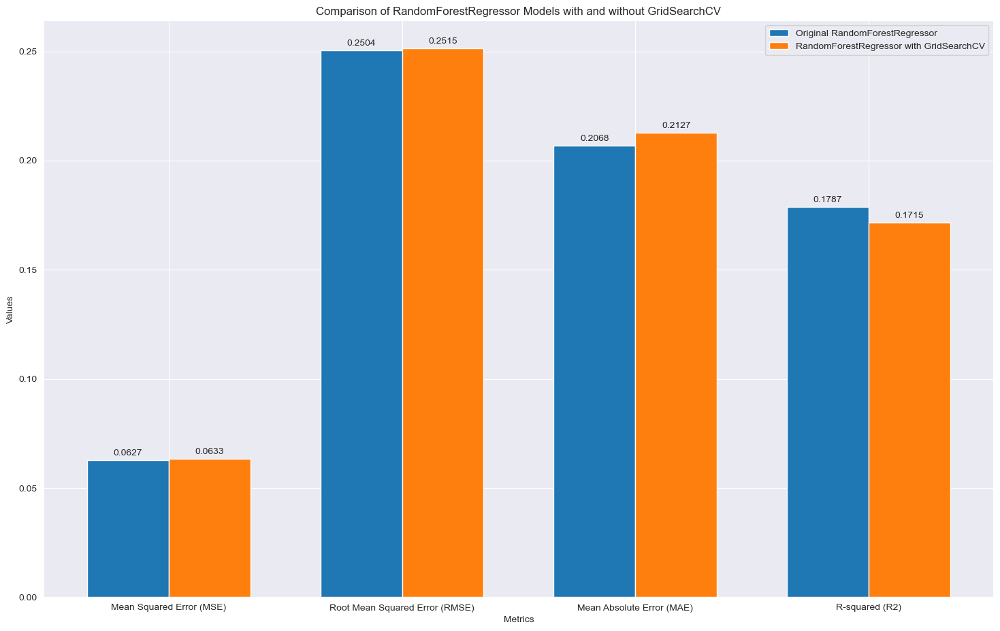

In [130]:
# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Train the Random Forest Regressor on the training set
rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_regressor.predict(X_test)

# Calculate Mean Squared Error (MSE)
mse_rf = mean_squared_error(y_test, y_pred_rf)

# Calculate Root Mean Squared Error (RMSE)
rmse_rf = np.sqrt(mse_rf)

# Calculate Mean Absolute Error (MAE)
mae_rf = mean_absolute_error(y_test, y_pred_rf)

# Calculate R-squared (R2) Score
r2_rf = r2_score(y_test, y_pred_rf)

# Print the results
print(f'Random Forest Regressor Mean Squared Error (MSE): {mse_rf:.4f}')
print(f'Random Forest Regressor Root Mean Squared Error (RMSE): {rmse_rf:.4f}')
print(f'Random Forest Regressor Mean Absolute Error (MAE): {mae_rf:.4f}')
print(f'Random Forest Regressor R-squared (R2) Score: {r2_rf:.4f}')

# Initialize the Random Forest Regressor
gs_rf_regressor = RandomForestRegressor(random_state=42)

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150],  # You can expand this list
    'max_depth': [None, 10, 20],  # You can expand this list
    'min_samples_split': [2, 5, 10],  # You can expand this list
    'min_samples_leaf': [1, 2, 4]  # You can expand this list
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gs_rf_regressor, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

# Get the best parameters from GridSearchCV
best_params = grid_search.best_params_

# Use the best parameters to train the model
best_rf_regressor = RandomForestRegressor(random_state=42, **best_params)
best_rf_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_grid_search = best_rf_regressor.predict(X_test)

# Calculate performance metrics for the RandomForestRegressor with GridSearchCV
mse_grid_search = mean_squared_error(y_test, y_pred_grid_search)
rmse_grid_search = np.sqrt(mse_grid_search)
mae_grid_search = mean_absolute_error(y_test, y_pred_grid_search)
r2_grid_search = r2_score(y_test, y_pred_grid_search)

#Print the results for RandomForestRegressor with GridSearchCV
print('\nRandom Forest Regressor with GridSearchCV:')
print(f'Mean Squared Error (MSE): {mse_grid_search:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_grid_search:.4f}')
print(f'Mean Absolute Error (MAE): {mae_grid_search:.4f}')
print(f'R-squared (R2) Score: {r2_grid_search:.4f}')

# Metrics for the original RandomForestRegressor
original_metrics_rf = [mse_rf, rmse_rf, mae_rf, r2_rf]

# Metrics for the RandomForestRegressor with GridSearchCV
grid_search_metrics_rf = [mse_grid_search, rmse_grid_search, mae_grid_search, r2_grid_search]

# Bar graph setup
metrics_labels = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width = 0.35
index = np.arange(len(metrics_labels))

# Plotting
fig, ax = plt.subplots()
bar1 = ax.bar(index, original_metrics_rf, bar_width, label='Original RandomForestRegressor')
bar2 = ax.bar(index + bar_width, grid_search_metrics_rf, bar_width, label='RandomForestRegressor with GridSearchCV')

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Comparison of RandomForestRegressor Models with and without GridSearchCV')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics_labels)
ax.legend()

# Display the values on top of the bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

plt.show()

GradientBoostingRegressor metrics
Mean Squared Error (MSE): 0.0626
Root Mean Squared Error (RMSE): 0.2502
Mean Absolute Error (MAE): 0.1971
R-squared (R2): 0.1804
GradientBoostingRegressor with Polynomial Features
Mean Squared Error (MSE) - Polynomial Regression: 0.0550
Root Mean Squared Error (RMSE) - Polynomial Regression: 0.2345
Mean Absolute Error (MAE) - Polynomial Regression: 0.1973
R-squared (R2) - Polynomial Regression: 0.2800


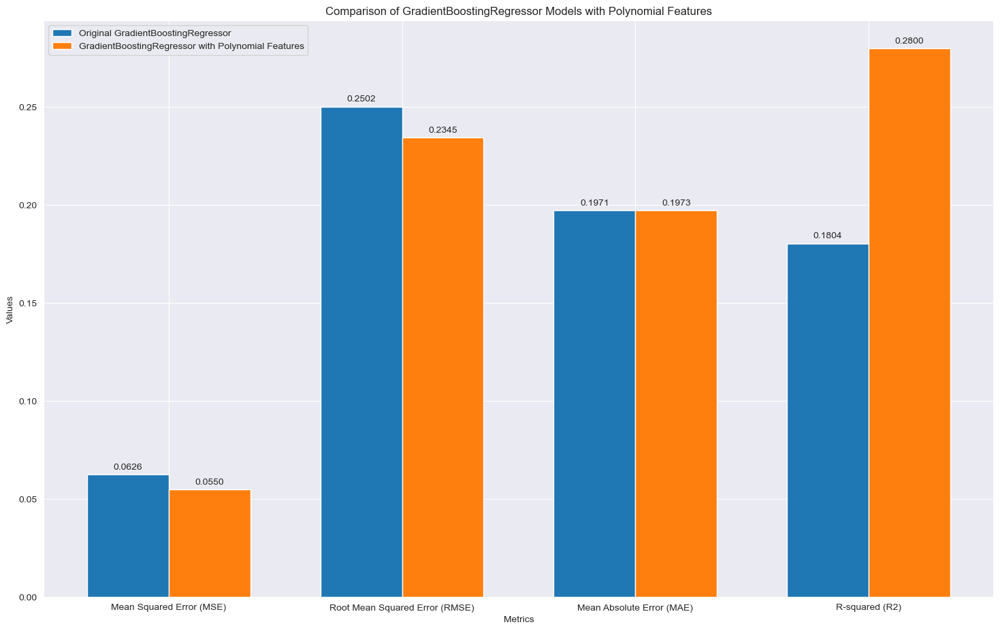

In [132]:

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Select the columns that need to be used as features for GradientBoostingRegressor
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the model
gradient_boosting_model = GradientBoostingRegressor(random_state=42)

# Train the model
gradient_boosting_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = gradient_boosting_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the regression metrics
print('GradientBoostingRegressor metrics')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R-squared (R2): {r2:.4f}')

# Feature Engineering: Polynomial Features
degree = 2  # You can experiment with different degrees

# Create a pipeline with PolynomialFeatures and GradientBoostingRegressor
gb_polyreg = make_pipeline(PolynomialFeatures(degree), GradientBoostingRegressor(random_state=42))

# Fit the pipeline on the training data
gb_polyreg.fit(X_train, y_train)

# Make predictions on the test set with Polynomial Features
y_pred_poly = gb_polyreg.predict(X_test)

# Calculate performance metrics for the GradientBoostingRegressor with Polynomial Features
mse_poly = mean_squared_error(y_test, y_pred_poly)
rmse_poly = np.sqrt(mse_poly)
mae_poly = mean_absolute_error(y_test, y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)

# Print the regression metrics
print('GradientBoostingRegressor with Polynomial Features')
print(f'Mean Squared Error (MSE) - Polynomial Regression: {mse_poly:.4f}')
print(f'Root Mean Squared Error (RMSE) - Polynomial Regression: {rmse_poly:.4f}')
print(f'Mean Absolute Error (MAE) - Polynomial Regression: {mae_poly:.4f}')
print(f'R-squared (R2) - Polynomial Regression: {r2_poly:.4f}')

# Metrics for the original GradientBoostingRegressor
original_metrics_gb = [mse, rmse, mae, r2]

# Metrics for the GradientBoostingRegressor with Polynomial Features
poly_metrics_gb = [mse_poly, rmse_poly, mae_poly, r2_poly]

# Bar graph setup
metrics_labels_gb = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_gb = 0.35
index_gb = np.arange(len(metrics_labels_gb))

# Plotting
fig_gb, ax_gb = plt.subplots()
bar1_gb = ax_gb.bar(index_gb, original_metrics_gb, bar_width_gb, label='Original GradientBoostingRegressor')
bar2_gb = ax_gb.bar(index_gb + bar_width_gb, poly_metrics_gb, bar_width_gb, label='GradientBoostingRegressor with Polynomial Features')

ax_gb.set_xlabel('Metrics')
ax_gb.set_ylabel('Values')
ax_gb.set_title('Comparison of GradientBoostingRegressor Models with Polynomial Features')
ax_gb.set_xticks(index_gb + bar_width_gb / 2)
ax_gb.set_xticklabels(metrics_labels_gb)
ax_gb.legend()

# Display the values on top of the bars
def add_labels_gb(bars):
    for bar_gb in bars:
        height_gb = bar_gb.get_height()
        ax_gb.annotate(f'{height_gb:.4f}',
                    xy=(bar_gb.get_x() + bar_gb.get_width() / 2, height_gb),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_gb(bar1_gb)
add_labels_gb(bar2_gb)

plt.show()


GradientBoosting Regressor metrics
Mean Squared Error (MSE): 0.0626
Root Mean Squared Error (RMSE): 0.2502
Mean Absolute Error (MAE): 0.1971
R-squared (R2): 0.1804

GradientBoosting Regressor with Min-Max Scaling:
Mean Squared Error (MSE): 0.0626
Root Mean Squared Error (RMSE): 0.2502
Mean Absolute Error (MAE): 0.1971
R-squared (R2) Score: 0.1804


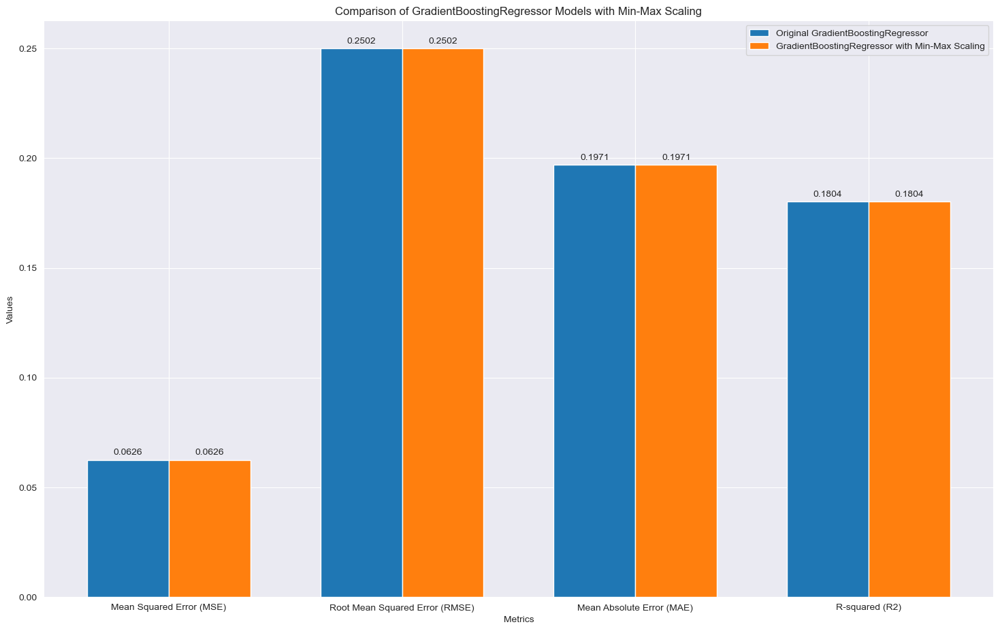

In [133]:
# Select the columns that need to be used as features for GradientBoostingRegressor
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the model
gradient_boosting_model = GradientBoostingRegressor(random_state=42)

# Train the model
gradient_boosting_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = gradient_boosting_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the regression metrics
print('GradientBoosting Regressor metrics')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R-squared (R2): {r2:.4f}')

# Initialize Min-Max Scaler
scaler = MinMaxScaler()

# Apply Min-Max Scaling to the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the GradientBoostingRegressor model with Min-Max Scaling
gb_model_scaled = GradientBoostingRegressor(random_state=42)

# Train the model on scaled data
gb_model_scaled.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_scaled = gb_model_scaled.predict(X_test_scaled)

# Evaluate the model with Min-Max Scaling
mse_scaled = mean_squared_error(y_test, y_pred_scaled)
rmse_scaled = np.sqrt(mse_scaled)
mae_scaled = mean_absolute_error(y_test, y_pred_scaled)
r2_scaled = r2_score(y_test, y_pred_scaled)

# Print the results for GradientBoostingRegressor with Min-Max Scaling
print('\nGradientBoosting Regressor with Min-Max Scaling:')
print(f'Mean Squared Error (MSE): {mse_scaled:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_scaled:.4f}')
print(f'Mean Absolute Error (MAE): {mae_scaled:.4f}')
print(f'R-squared (R2) Score: {r2_scaled:.4f}')

# Metrics for the original GradientBoostingRegressor
original_metrics_gb = [mse, rmse, mae, r2]

# Metrics for the GradientBoostingRegressor with Min-Max Scaling
scaled_metrics_gb = [mse_scaled, rmse_scaled, mae_scaled, r2_scaled]

# Bar graph setup
metrics_labels_gb = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_gb = 0.35
index_gb = np.arange(len(metrics_labels_gb))

# Plotting
fig_gb, ax_gb = plt.subplots()
bar1_gb = ax_gb.bar(index_gb, original_metrics_gb, bar_width_gb, label='Original GradientBoostingRegressor')
bar2_gb = ax_gb.bar(index_gb + bar_width_gb, scaled_metrics_gb, bar_width_gb, label='GradientBoostingRegressor with Min-Max Scaling')

ax_gb.set_xlabel('Metrics')
ax_gb.set_ylabel('Values')
ax_gb.set_title('Comparison of GradientBoostingRegressor Models with Min-Max Scaling')
ax_gb.set_xticks(index_gb + bar_width_gb / 2)
ax_gb.set_xticklabels(metrics_labels_gb)
ax_gb.legend()

# Display the values on top of the bars
def add_labels_gb(bars):
    for bar_gb in bars:
        height_gb = bar_gb.get_height()
        ax_gb.annotate(f'{height_gb:.4f}',
                    xy=(bar_gb.get_x() + bar_gb.get_width() / 2, height_gb),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_gb(bar1_gb)
add_labels_gb(bar2_gb)

plt.show()

GradientBoosting Regressor metrics
Mean Squared Error (MSE): 0.0626
Root Mean Squared Error (RMSE): 0.2502
Mean Absolute Error (MAE): 0.1971
R-squared (R2): 0.1804

GradientBoostingRegressor with Cross-Validation:
Mean Squared Error (MSE): 0.0567
Root Mean Squared Error (RMSE): 0.2371
Mean Absolute Error (MAE): -0.1849
R-squared (R2) Score: -0.0140


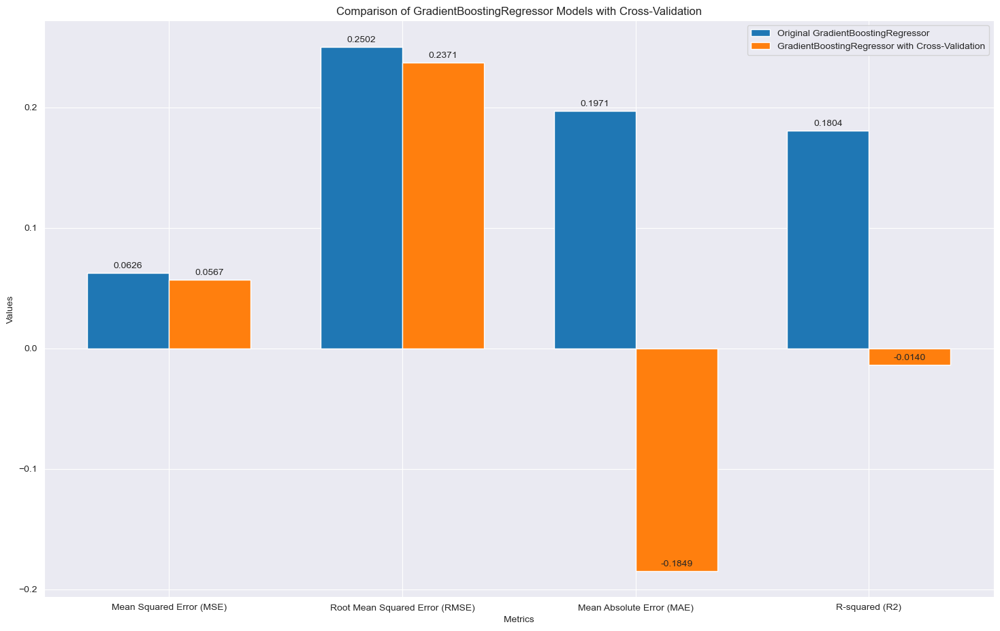

In [134]:
# Select the columns that need to be used as features for GradientBoostingRegressor
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the model
gradient_boosting_model = GradientBoostingRegressor(random_state=42)

# Train the model
gradient_boosting_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = gradient_boosting_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
# Print the regression metrics
print('GradientBoosting Regressor metrics')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R-squared (R2): {r2:.4f}')


# Initialize the model with cross-validation
cv_gradient_boosting_model = GradientBoostingRegressor(random_state=42)

# Cross-Validation
cv_scores_gb = cross_val_score(cv_gradient_boosting_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_gb = np.sqrt(-cv_scores_gb)
cv_mse_gb = -cv_scores_gb
cv_mae_gb = cross_val_score(cv_gradient_boosting_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_r2_gb = cross_val_score(cv_gradient_boosting_model, X_train, y_train, cv=5, scoring='r2')

# Calculate mean values for cross-validation metrics
cv_mse_mean_gb = np.mean(cv_mse_gb)
cv_rmse_mean_gb = np.mean(cv_rmse_gb)
cv_mae_mean_gb = np.mean(cv_mae_gb)
cv_r2_mean_gb = np.mean(cv_r2_gb)

# Print the results for GradientBoostingRegressor with Cross-Validation
print('\nGradientBoostingRegressor with Cross-Validation:')
print(f'Mean Squared Error (MSE): {cv_mse_mean_gb:.4f}')
print(f'Root Mean Squared Error (RMSE): {cv_rmse_mean_gb:.4f}')
print(f'Mean Absolute Error (MAE): {cv_mae_mean_gb:.4f}')
print(f'R-squared (R2) Score: {cv_r2_mean_gb:.4f}')


# Metrics for the original GradientBoostingRegressor
original_metrics_gb = [mse, rmse, mae, r2]

# Metrics for the GradientBoostingRegressor with Cross-Validation
cv_metrics_gb = [cv_mse_mean_gb, cv_rmse_mean_gb, cv_mae_mean_gb, cv_r2_mean_gb]

# Bar graph setup
metrics_labels_gb = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_gb = 0.35
index_gb = np.arange(len(metrics_labels_gb))

# Plotting
fig_gb, ax_gb = plt.subplots()
bar1_gb = ax_gb.bar(index_gb, original_metrics_gb, bar_width_gb, label='Original GradientBoostingRegressor')
bar2_gb = ax_gb.bar(index_gb + bar_width_gb, cv_metrics_gb, bar_width_gb, label='GradientBoostingRegressor with Cross-Validation')

ax_gb.set_xlabel('Metrics')
ax_gb.set_ylabel('Values')
ax_gb.set_title('Comparison of GradientBoostingRegressor Models with Cross-Validation')
ax_gb.set_xticks(index_gb + bar_width_gb / 2)
ax_gb.set_xticklabels(metrics_labels_gb)
ax_gb.legend()

# Display the values on top of the bars
def add_labels_gb(bars):
    for bar_gb in bars:
        height_gb = bar_gb.get_height()
        ax_gb.annotate(f'{height_gb:.4f}',
                    xy=(bar_gb.get_x() + bar_gb.get_width() / 2, height_gb),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_gb(bar1_gb)
add_labels_gb(bar2_gb)

plt.show()

GradientBoosting Regressor metrics
Mean Squared Error (MSE): 0.0626
Root Mean Squared Error (RMSE): 0.2502
Mean Absolute Error (MAE): 0.1971
R-squared (R2): 0.1804

GradientBoostingRegressor with GridSearchCV:
Mean Squared Error (MSE): 0.0622
Root Mean Squared Error (RMSE): 0.2494
Mean Absolute Error (MAE): 0.2038
R-squared (R2) Score: 0.1853


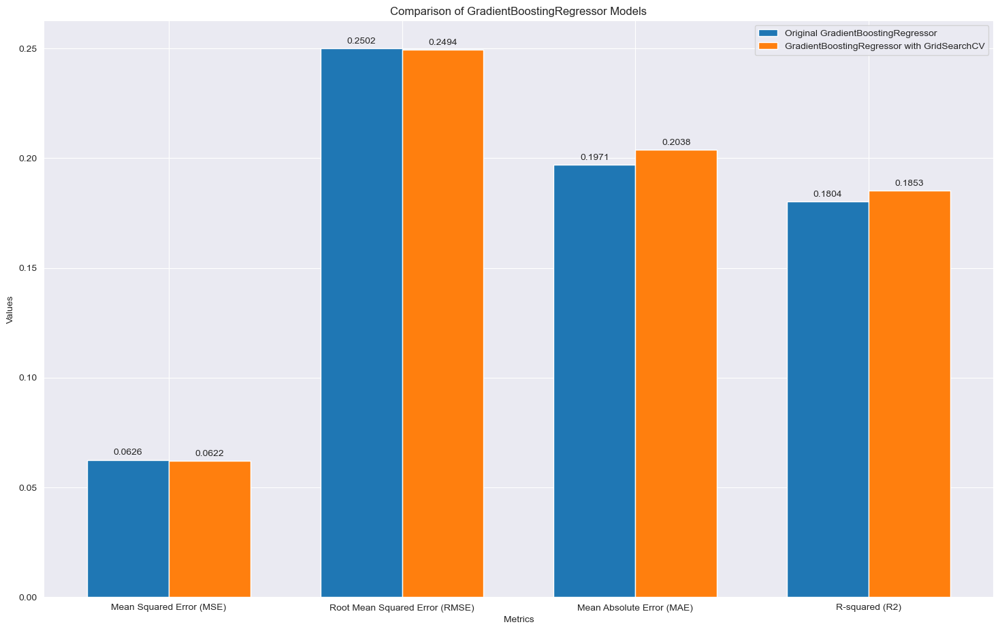

In [136]:
# Select the columns that need to be used as features for GradientBoostingRegressor
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the model
gradient_boosting_model = GradientBoostingRegressor(random_state=42)

# Train the model
gradient_boosting_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = gradient_boosting_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the regression metrics
print('GradientBoosting Regressor metrics')
print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R-squared (R2): {r2:.4f}')

# Initialize the GradientBoostingRegressor model
gradient_boosting_model = GradientBoostingRegressor(random_state=42)

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gradient_boosting_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

# Get the best parameters from GridSearchCV
best_params = grid_search.best_params_

# Use the best parameters to train the model
best_gradient_boosting_model = GradientBoostingRegressor(random_state=42, **best_params)
best_gradient_boosting_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_grid_search = best_gradient_boosting_model.predict(X_test)

# Evaluate the model with best parameters
mse_grid_search = mean_squared_error(y_test, y_pred_grid_search)
rmse_grid_search = np.sqrt(mse_grid_search)
mae_grid_search = mean_absolute_error(y_test, y_pred_grid_search)
r2_grid_search = r2_score(y_test, y_pred_grid_search)

# Print the results for GradientBoostingRegressor with GridSearchCV
print('\nGradientBoostingRegressor with GridSearchCV:')
print(f'Mean Squared Error (MSE): {mse_grid_search:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_grid_search:.4f}')
print(f'Mean Absolute Error (MAE): {mae_grid_search:.4f}')
print(f'R-squared (R2) Score: {r2_grid_search:.4f}')

#Metrics for the original GradientBoostingRegressor
original_metrics_gb = [mse, rmse, mae, r2]

# Metrics for the GradientBoostingRegressor with GridSearchCV
grid_search_metrics_gb = [mse_grid_search, rmse_grid_search, mae_grid_search, r2_grid_search]

# Bar graph setup
metrics_labels_gb = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_gb = 0.35
index_gb = np.arange(len(metrics_labels_gb))

# Plotting
fig_gb, ax_gb = plt.subplots()
bar1_gb = ax_gb.bar(index_gb, original_metrics_gb, bar_width_gb, label='Original GradientBoostingRegressor')
bar2_gb = ax_gb.bar(index_gb + bar_width_gb, grid_search_metrics_gb, bar_width_gb, label='GradientBoostingRegressor with GridSearchCV')

ax_gb.set_xlabel('Metrics')
ax_gb.set_ylabel('Values')
ax_gb.set_title('Comparison of GradientBoostingRegressor Models')
ax_gb.set_xticks(index_gb + bar_width_gb / 2)
ax_gb.set_xticklabels(metrics_labels_gb)
ax_gb.legend()

# Display the values on top of the bars
def add_labels_gb(bars):
    for bar_gb in bars:
        height_gb = bar_gb.get_height()
        ax_gb.annotate(f'{height_gb:.4f}',
                    xy=(bar_gb.get_x() + bar_gb.get_width() / 2, height_gb),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_gb(bar1_gb)
add_labels_gb(bar2_gb)

plt.show()


Mean Squared Error (MSE) - SVR: 0.055946301457402633
Root Mean Squared Error (RMSE) - SVR: 0.23652970523256192
Mean Absolute Error (MAE) - SVR: 0.20476116885435547
R-squared (R2) - SVR: 0.2672760518470849
Explained Variance Score (EVS) - SVR: 0.26819221834741813

SVR with Polynomial Features:
Mean Squared Error (MSE): 0.0599
Root Mean Squared Error (RMSE): 0.2447
Mean Absolute Error (MAE): 0.2137
R-squared (R2): 0.2160
Explained Variance Score (EVS): 0.2167


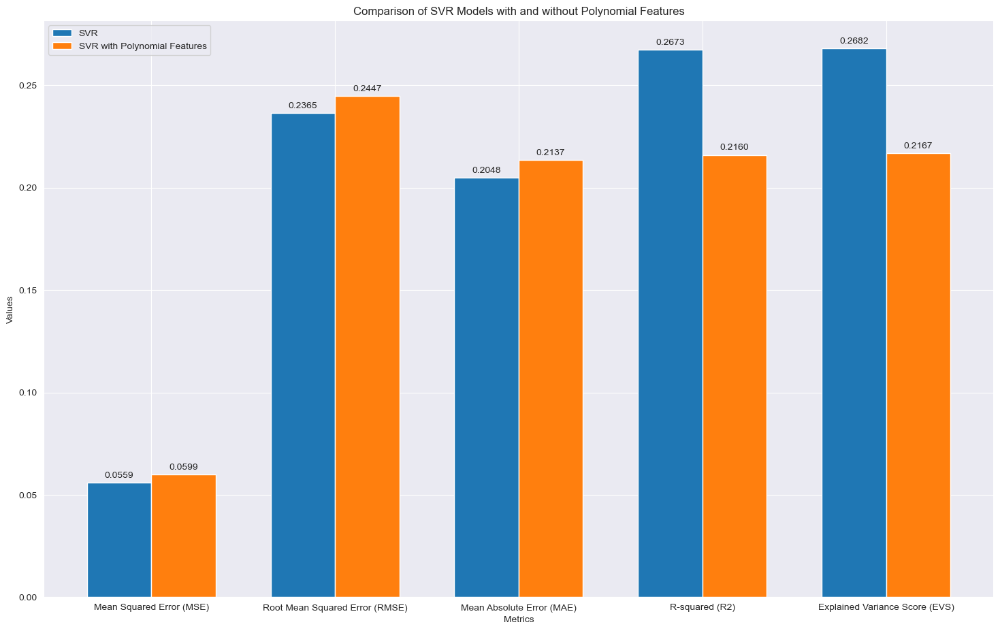

In [137]:
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize the SVR model
svr_model = SVR()

# Train the SVR model
svr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svr = svr_model.predict(X_test)

# Evaluate the SVR model
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
evs_svr = explained_variance_score(y_test, y_pred_svr)

# Print the regression metrics for SVR
print(f'Mean Squared Error (MSE) - SVR: {mse_svr}')
print(f'Root Mean Squared Error (RMSE) - SVR: {rmse_svr}')
print(f'Mean Absolute Error (MAE) - SVR: {mae_svr}')
print(f'R-squared (R2) - SVR: {r2_svr}')
print(f'Explained Variance Score (EVS) - SVR: {evs_svr}')

# Feature Engineering: Polynomial Features
degree = 2  # You can experiment with different degrees
svr_polyreg = make_pipeline(PolynomialFeatures(degree), SVR())
svr_polyreg.fit(X_train, y_train)

# Make predictions on the test set with Polynomial Features
y_pred_svr_poly = svr_polyreg.predict(X_test)

# Evaluate the SVR model with Polynomial Features
mse_svr_poly = mean_squared_error(y_test, y_pred_svr_poly)
rmse_svr_poly = np.sqrt(mse_svr_poly)
mae_svr_poly = mean_absolute_error(y_test, y_pred_svr_poly)
r2_svr_poly = r2_score(y_test, y_pred_svr_poly)
evs_svr_poly = explained_variance_score(y_test, y_pred_svr_poly)

# Print the regression metrics for SVR with Polynomial Features
print('\nSVR with Polynomial Features:')
print(f'Mean Squared Error (MSE): {mse_svr_poly:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_svr_poly:.4f}')
print(f'Mean Absolute Error (MAE): {mae_svr_poly:.4f}')
print(f'R-squared (R2): {r2_svr_poly:.4f}')
print(f'Explained Variance Score (EVS): {evs_svr_poly:.4f}')

# Regression metrics for SVR
svr_metrics = [mse_svr, rmse_svr, mae_svr, r2_svr, evs_svr]

# Regression metrics for SVR with Polynomial Features
svr_poly_metrics = [mse_svr_poly, rmse_svr_poly, mae_svr_poly, r2_svr_poly, evs_svr_poly]

# Bar graph setup
metrics_labels_svr = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)', 'Explained Variance Score (EVS)']
bar_width_svr = 0.35
index_svr = np.arange(len(metrics_labels_svr))

# Plotting
fig_svr, ax_svr = plt.subplots()
bar1_svr = ax_svr.bar(index_svr, svr_metrics, bar_width_svr, label='SVR')
bar2_svr = ax_svr.bar(index_svr + bar_width_svr, svr_poly_metrics, bar_width_svr, label='SVR with Polynomial Features')

ax_svr.set_xlabel('Metrics')
ax_svr.set_ylabel('Values')
ax_svr.set_title('Comparison of SVR Models with and without Polynomial Features')
ax_svr.set_xticks(index_svr + bar_width_svr / 2)
ax_svr.set_xticklabels(metrics_labels_svr)
ax_svr.legend()

# Display the values on top of the bars
def add_labels_svr(bars):
    for bar_svr in bars:
        height_svr = bar_svr.get_height()
        ax_svr.annotate(f'{height_svr:.4f}',
                    xy=(bar_svr.get_x() + bar_svr.get_width() / 2, height_svr),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_svr(bar1_svr)
add_labels_svr(bar2_svr)

plt.show()

Mean Squared Error (MSE) - SVR: 0.055946301457402633
Root Mean Squared Error (RMSE) - SVR: 0.23652970523256192
Mean Absolute Error (MAE) - SVR: 0.20476116885435547
R-squared (R2) - SVR: 0.2672760518470849
Explained Variance Score (EVS) - SVR: 0.26819221834741813

SVR with Min-Max Scaling:
Mean Squared Error (MSE): 0.0551
Root Mean Squared Error (RMSE): 0.2347
Mean Absolute Error (MAE): 0.1981
R-squared (R2) Score: 0.2783


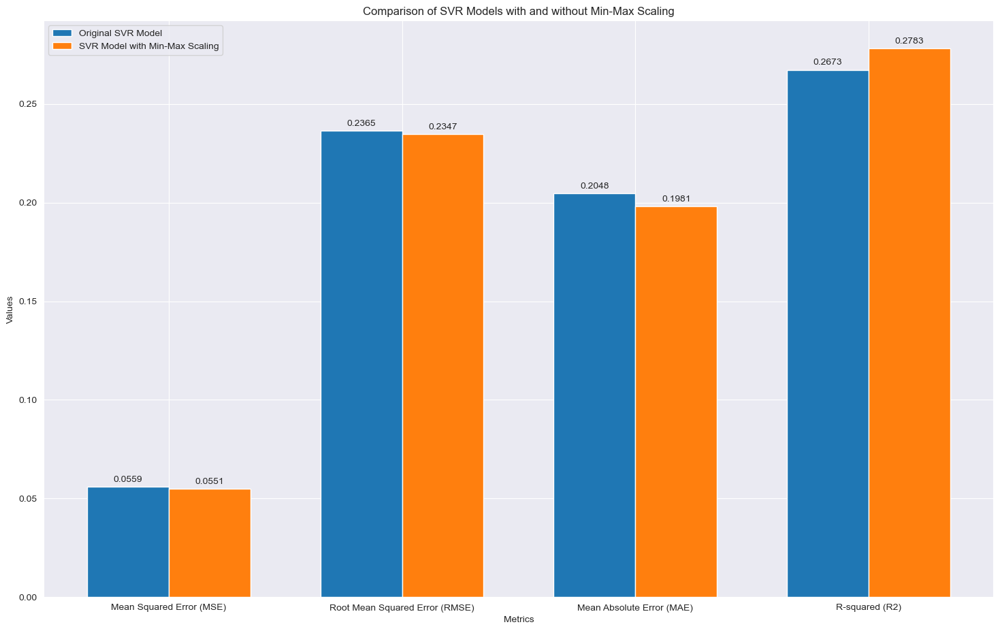

In [138]:
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize the SVR model
svr_model = SVR()

# Train the SVR model
svr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svr = svr_model.predict(X_test)

# Evaluate the SVR model
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
evs_svr = explained_variance_score(y_test, y_pred_svr)

# Print the regression metrics for SVR
print(f'Mean Squared Error (MSE) - SVR: {mse_svr}')
print(f'Root Mean Squared Error (RMSE) - SVR: {rmse_svr}')
print(f'Mean Absolute Error (MAE) - SVR: {mae_svr}')
print(f'R-squared (R2) - SVR: {r2_svr}')
print(f'Explained Variance Score (EVS) - SVR: {evs_svr}')

# Initialize Min-Max Scaler
scaler = MinMaxScaler()

# Apply Min-Max Scaling to the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the SVR model with Min-Max Scaling
svr_model_scaled = SVR()

# Train the SVR model on scaled data
svr_model_scaled.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_svr_scaled = svr_model_scaled.predict(X_test_scaled)

# Evaluate the SVR model with Min-Max Scaling
mse_svr_scaled = mean_squared_error(y_test, y_pred_svr_scaled)
rmse_svr_scaled = np.sqrt(mse_svr_scaled)
mae_svr_scaled = mean_absolute_error(y_test, y_pred_svr_scaled)
r2_svr_scaled = r2_score(y_test, y_pred_svr_scaled)

# Print the results for SVR with Min-Max Scaling
print('\nSVR with Min-Max Scaling:')
print(f'Mean Squared Error (MSE): {mse_svr_scaled:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_svr_scaled:.4f}')
print(f'Mean Absolute Error (MAE): {mae_svr_scaled:.4f}')
print(f'R-squared (R2) Score: {r2_svr_scaled:.4f}')

# Metrics for the original SVR model
original_metrics_svr = [mse_svr, rmse_svr, mae_svr, r2_svr]

# Metrics for the SVR model with Min-Max Scaling
scaled_metrics_svr = [mse_svr_scaled, rmse_svr_scaled, mae_svr_scaled, r2_svr_scaled]

# Bar graph setup
metrics_labels_svr = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_svr = 0.35
index_svr = np.arange(len(metrics_labels_svr))

# Plotting
fig_svr, ax_svr = plt.subplots()
bar1_svr = ax_svr.bar(index_svr, original_metrics_svr, bar_width_svr, label='Original SVR Model')
bar2_svr = ax_svr.bar(index_svr + bar_width_svr, scaled_metrics_svr, bar_width_svr, label='SVR Model with Min-Max Scaling')

ax_svr.set_xlabel('Metrics')
ax_svr.set_ylabel('Values')
ax_svr.set_title('Comparison of SVR Models with and without Min-Max Scaling')
ax_svr.set_xticks(index_svr + bar_width_svr / 2)
ax_svr.set_xticklabels(metrics_labels_svr)
ax_svr.legend()

# Display the values on top of the bars
def add_labels_svr(bars):
    for bar_svr in bars:
        height_svr = bar_svr.get_height()
        ax_svr.annotate(f'{height_svr:.4f}',
                    xy=(bar_svr.get_x() + bar_svr.get_width() / 2, height_svr),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_svr(bar1_svr)
add_labels_svr(bar2_svr)

plt.show()

Mean Squared Error (MSE) - SVR: 0.055946301457402633
Root Mean Squared Error (RMSE) - SVR: 0.23652970523256192
Mean Absolute Error (MAE) - SVR: 0.20476116885435547
R-squared (R2) - SVR: 0.2672760518470849
Explained Variance Score (EVS) - SVR: 0.26819221834741813

SVR with Cross-Validation:
Mean Squared Error (MSE): 0.0475
Root Mean Squared Error (RMSE): 0.2169
Mean Absolute Error (MAE): -0.1701
R-squared (R2) Score: 0.1464


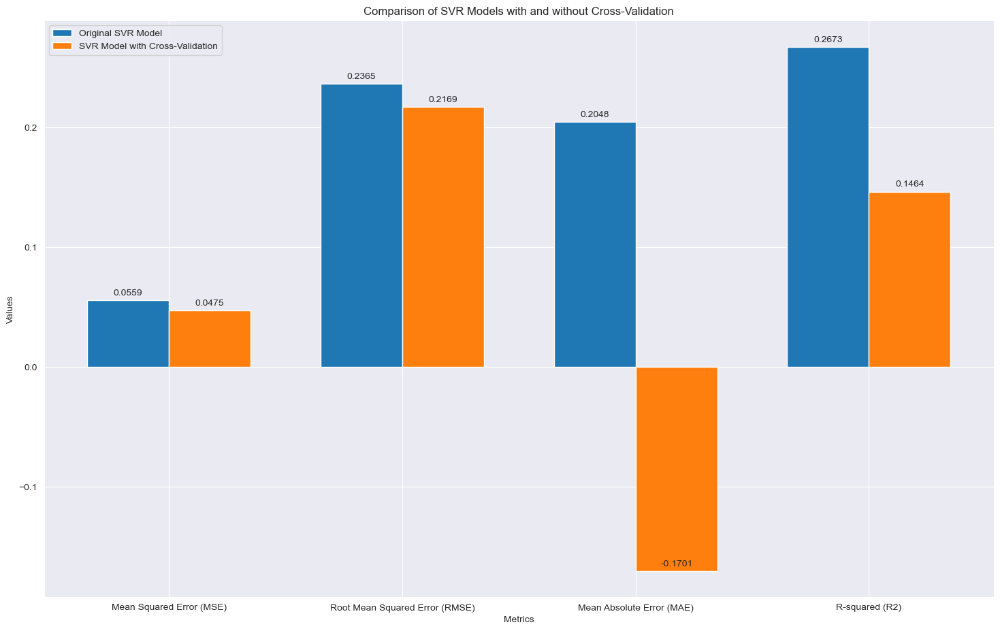

In [139]:
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize the SVR model
svr_model = SVR()

# Train the SVR model
svr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svr = svr_model.predict(X_test)

# Evaluate the SVR model
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
evs_svr = explained_variance_score(y_test, y_pred_svr)

# Print the regression metrics for SVR
print(f'Mean Squared Error (MSE) - SVR: {mse_svr}')
print(f'Root Mean Squared Error (RMSE) - SVR: {rmse_svr}')
print(f'Mean Absolute Error (MAE) - SVR: {mae_svr}')
print(f'R-squared (R2) - SVR: {r2_svr}')
print(f'Explained Variance Score (EVS) - SVR: {evs_svr}')

# Initialize the SVR model with cross-validation
cv_svr_model = SVR()

# Cross-Validation
cv_scores_svr = cross_val_score(cv_svr_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_svr = np.sqrt(-cv_scores_svr)
cv_mse_svr = -cv_scores_svr
cv_mae_svr = cross_val_score(cv_svr_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_r2_svr = cross_val_score(cv_svr_model, X_train, y_train, cv=5, scoring='r2')

# Calculate mean values for cross-validation metrics
cv_mse_mean_svr = np.mean(cv_mse_svr)
cv_rmse_mean_svr = np.mean(cv_rmse_svr)
cv_mae_mean_svr = np.mean(cv_mae_svr)
cv_r2_mean_svr = np.mean(cv_r2_svr)

# Print the results for SVR with Cross-Validation
print('\nSVR with Cross-Validation:')
print(f'Mean Squared Error (MSE): {cv_mse_mean_svr:.4f}')
print(f'Root Mean Squared Error (RMSE): {cv_rmse_mean_svr:.4f}')
print(f'Mean Absolute Error (MAE): {cv_mae_mean_svr:.4f}')
print(f'R-squared (R2) Score: {cv_r2_mean_svr:.4f}')

# Metrics for the original SVR model
original_metrics_svr = [mse_svr, rmse_svr, mae_svr, r2_svr]

# Metrics for the SVR model with Min-Max Scaling
scaled_metrics_svr = [cv_mse_mean_svr, cv_rmse_mean_svr, cv_mae_mean_svr, cv_r2_mean_svr]

# Bar graph setup
metrics_labels_svr = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_svr = 0.35
index_svr = np.arange(len(metrics_labels_svr))

# Plotting
fig_svr, ax_svr = plt.subplots()
bar1_svr = ax_svr.bar(index_svr, original_metrics_svr, bar_width_svr, label='Original SVR Model')
bar2_svr = ax_svr.bar(index_svr + bar_width_svr, scaled_metrics_svr, bar_width_svr, label='SVR Model with Cross-Validation')

ax_svr.set_xlabel('Metrics')
ax_svr.set_ylabel('Values')
ax_svr.set_title('Comparison of SVR Models with and without Cross-Validation')
ax_svr.set_xticks(index_svr + bar_width_svr / 2)
ax_svr.set_xticklabels(metrics_labels_svr)
ax_svr.legend()

# Display the values on top of the bars
def add_labels_svr(bars):
    for bar_svr in bars:
        height_svr = bar_svr.get_height()
        ax_svr.annotate(f'{height_svr:.4f}',
                    xy=(bar_svr.get_x() + bar_svr.get_width() / 2, height_svr),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_svr(bar1_svr)
add_labels_svr(bar2_svr)

plt.show()

Mean Squared Error (MSE) - SVR: 0.055946301457402633
Root Mean Squared Error (RMSE) - SVR: 0.23652970523256192
Mean Absolute Error (MAE) - SVR: 0.20476116885435547
R-squared (R2) - SVR: 0.2672760518470849
Explained Variance Score (EVS) - SVR: 0.26819221834741813

SVR with GridSearchCV:
Mean Squared Error (MSE): 0.0566
Root Mean Squared Error (RMSE): 0.2380
Mean Absolute Error (MAE): 0.1993
R-squared (R2) Score: 0.2582


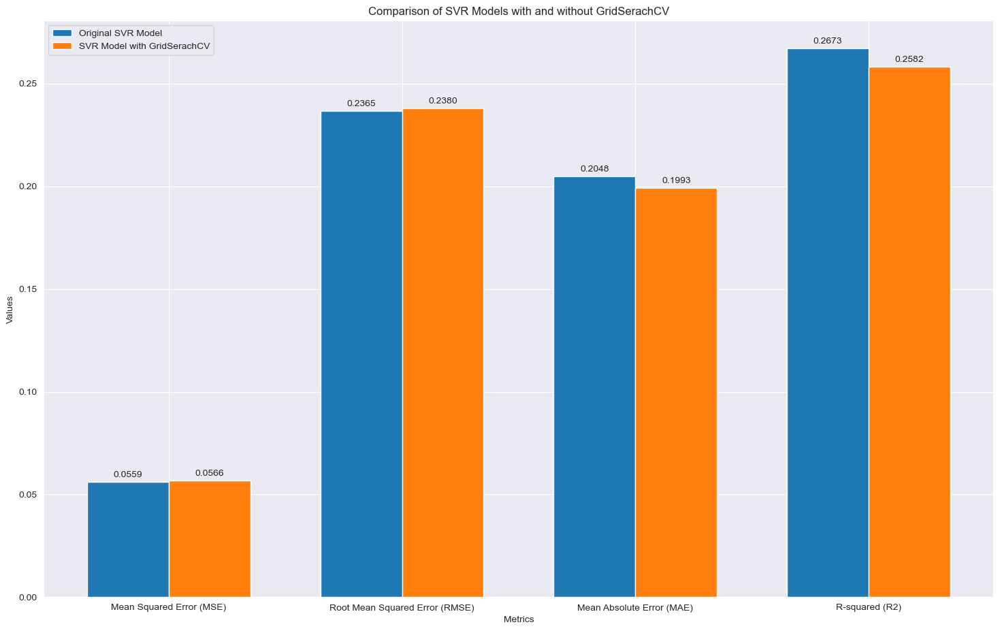

In [140]:
# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize the SVR model
svr_model = SVR()

# Train the SVR model
svr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_svr = svr_model.predict(X_test)

# Evaluate the SVR model
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
evs_svr = explained_variance_score(y_test, y_pred_svr)

# Print the regression metrics for SVR
print(f'Mean Squared Error (MSE) - SVR: {mse_svr}')
print(f'Root Mean Squared Error (RMSE) - SVR: {rmse_svr}')
print(f'Mean Absolute Error (MAE) - SVR: {mae_svr}')
print(f'R-squared (R2) - SVR: {r2_svr}')
print(f'Explained Variance Score (EVS) - SVR: {evs_svr}')

# Initialize the SVR model
svr_model = SVR()

# Define the parameter grid for GridSearchCV
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly'],
    'degree': [2, 3, 4],
    'gamma': ['scale', 'auto']
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=svr_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters from GridSearchCV
best_params = grid_search.best_params_

# Use the best parameters to train the model
best_svr_model = SVR(**best_params)
best_svr_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_svr_grid_search = best_svr_model.predict(X_test_scaled)

# Evaluate the SVR model with GridSearchCV
mse_svr_grid_search = mean_squared_error(y_test, y_pred_svr_grid_search)
rmse_svr_grid_search = np.sqrt(mse_svr_grid_search)
mae_svr_grid_search = mean_absolute_error(y_test, y_pred_svr_grid_search)
r2_svr_grid_search = r2_score(y_test, y_pred_svr_grid_search)

# Print the results for SVR with GridSearchCV
print('\nSVR with GridSearchCV:')
print(f'Mean Squared Error (MSE): {mse_svr_grid_search:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_svr_grid_search:.4f}')
print(f'Mean Absolute Error (MAE): {mae_svr_grid_search:.4f}')
print(f'R-squared (R2) Score: {r2_svr_grid_search:.4f}')

# Metrics for the original SVR model
original_metrics_svr = [mse_svr, rmse_svr, mae_svr, r2_svr]

# Metrics for the SVR model with Min-Max Scaling
gs_metrics_svr = [mse_svr_grid_search, rmse_svr_grid_search, mae_svr_grid_search, r2_svr_grid_search]

# Bar graph setup
metrics_labels_svr = ['Mean Squared Error (MSE)', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'R-squared (R2)']
bar_width_svr = 0.35
index_svr = np.arange(len(metrics_labels_svr))

# Plotting
fig_svr, ax_svr = plt.subplots()
bar1_svr = ax_svr.bar(index_svr, original_metrics_svr, bar_width_svr, label='Original SVR Model')
bar2_svr = ax_svr.bar(index_svr + bar_width_svr, gs_metrics_svr, bar_width_svr, label='SVR Model with GridSerachCV')

ax_svr.set_xlabel('Metrics')
ax_svr.set_ylabel('Values')
ax_svr.set_title('Comparison of SVR Models with and without GridSerachCV')
ax_svr.set_xticks(index_svr + bar_width_svr / 2)
ax_svr.set_xticklabels(metrics_labels_svr)
ax_svr.legend()

# Display the values on top of the bars
def add_labels_svr(bars):
    for bar_svr in bars:
        height_svr = bar_svr.get_height()
        ax_svr.annotate(f'{height_svr:.4f}',
                    xy=(bar_svr.get_x() + bar_svr.get_width() / 2, height_svr),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels_svr(bar1_svr)
add_labels_svr(bar2_svr)

plt.show()

Epoch 1/50
6/6 [==============================] - 1s 24ms/step - loss: 1.7486 - val_loss: 0.8258
Epoch 2/50
6/6 [==============================] - 0s 8ms/step - loss: 0.5562 - val_loss: 0.1705
Epoch 3/50
6/6 [==============================] - 0s 8ms/step - loss: 0.1280 - val_loss: 0.0980
Epoch 4/50
6/6 [==============================] - 0s 7ms/step - loss: 0.1205 - val_loss: 0.1509
Epoch 5/50
6/6 [==============================] - 0s 6ms/step - loss: 0.1368 - val_loss: 0.1315
Epoch 6/50
6/6 [==============================] - 0s 8ms/step - loss: 0.1076 - val_loss: 0.0968
Epoch 7/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0834 - val_loss: 0.0789
Epoch 8/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0710 - val_loss: 0.0732
Epoch 9/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0647 - val_loss: 0.0700
Epoch 10/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0580 - val_loss: 0.0684
Epoch 11/50
6/6 [=====================

6/6 [==============================] - 0s 7ms/step - loss: 0.1204 - val_loss: 0.1023
Epoch 36/50
6/6 [==============================] - 0s 7ms/step - loss: 0.1144 - val_loss: 0.1023
Epoch 37/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0746 - val_loss: 0.1029
Epoch 38/50
6/6 [==============================] - 0s 8ms/step - loss: 0.0826 - val_loss: 0.1034
Epoch 39/50
6/6 [==============================] - 0s 7ms/step - loss: 0.1043 - val_loss: 0.1034
Epoch 40/50
6/6 [==============================] - 0s 7ms/step - loss: 0.1064 - val_loss: 0.1022
Epoch 41/50
6/6 [==============================] - 0s 8ms/step - loss: 0.0717 - val_loss: 0.0972
Epoch 42/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0923 - val_loss: 0.0942
Epoch 43/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0837 - val_loss: 0.0945
Epoch 44/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0813 - val_loss: 0.0943
Epoch 45/50
6/6 [=========================

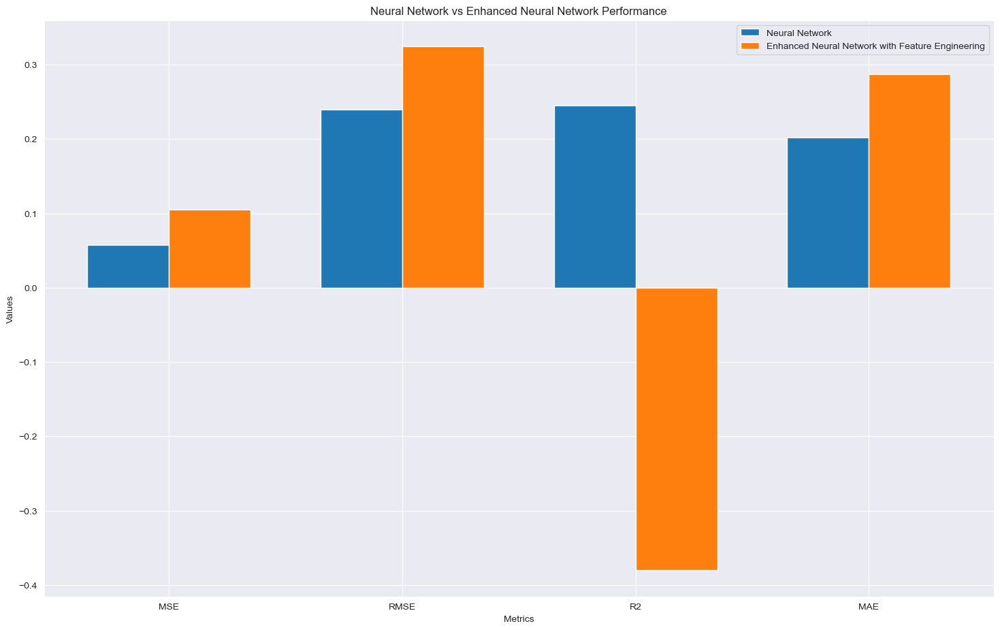

In [143]:

features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the neural network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions on the test set
y_pred_nn = model.predict(X_test).flatten()

# Evaluate the Neural Network model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
r2_nn = r2_score(y_test, y_pred_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)



# Feature Engineering: Standard Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the enhanced neural network model
enhanced_model = keras.Sequential([
    keras.layers.Dense(128, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    keras.layers.BatchNormalization(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dropout(0.5),  # Adding dropout for regularization
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the enhanced model
enhanced_model.compile(optimizer='adam', loss='mean_squared_error')

# Train the enhanced model
enhanced_model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions on the scaled test set
y_pred_enhanced_nn = enhanced_model.predict(X_test_scaled).flatten()

# Evaluate the enhanced Neural Network model
mse_enhanced_nn = mean_squared_error(y_test, y_pred_enhanced_nn)
rmse_enhanced_nn = np.sqrt(mse_enhanced_nn)
r2_enhanced_nn = r2_score(y_test, y_pred_enhanced_nn)
mae_enhanced_nn = mean_absolute_error(y_test, y_pred_enhanced_nn)

# Print the regression metrics for the Neural Network
print('\n Neural Network Metrics:')
print(f'Mean Squared Error (MSE) - Neural Network: {mse_nn}')
print(f'Root Mean Squared Error (RMSE) - Neural Network: {rmse_nn}')
print(f'R-squared (R2) - Neural Network: {r2_nn}')
print(f'Mean Absolute Error (MAE) - Neural Network: {mae_nn}')

# Print the regression metrics for the enhanced Neural Network
print('\nEnhanced Neural Network Metrics with Feature Engineering:')
print(f'Mean Squared Error (MSE): {mse_enhanced_nn:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse_enhanced_nn:.4f}')
print(f'R-squared (R2): {r2_enhanced_nn:.4f}')
print(f'Mean Absolute Error (MAE): {evs_enhanced_nn:.4f}')

# Define the metrics for the two models
metrics_labels = ['MSE', 'RMSE', 'R2', 'MAE']
nn_metrics = [mse_nn, rmse_nn, r2_nn, mae_nn]
enhanced_nn_metrics = [mse_enhanced_nn, rmse_enhanced_nn, r2_enhanced_nn, mae_enhanced_nn]

# Set up the bar graph
bar_width = 0.35
index = np.arange(len(metrics_labels))

# Create bars for Neural Network and Enhanced Neural Network
plt.bar(index, nn_metrics, bar_width, label='Neural Network')
plt.bar(index + bar_width, enhanced_nn_metrics, bar_width, label='Enhanced Neural Network with Feature Engineering')

# Labeling and customization
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Neural Network vs Enhanced Neural Network Performance')
plt.xticks(index + bar_width / 2, metrics_labels)
plt.legend()

# Show the bar graph
plt.show()

Epoch 1/50
6/6 [==============================] - 1s 22ms/step - loss: 0.1608 - val_loss: 0.1031
Epoch 2/50
6/6 [==============================] - 0s 6ms/step - loss: 0.1106 - val_loss: 0.0777
Epoch 3/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0847 - val_loss: 0.0945
Epoch 4/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0783 - val_loss: 0.0699
Epoch 5/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0680 - val_loss: 0.0641
Epoch 6/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0606 - val_loss: 0.0710
Epoch 7/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0538 - val_loss: 0.0610
Epoch 8/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0500 - val_loss: 0.0602
Epoch 9/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0458 - val_loss: 0.0633
Epoch 10/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0435 - val_loss: 0.0607
Epoch 11/50
6/6 [=====================

6/6 [==============================] - 0s 7ms/step - loss: 0.0381 - val_loss: 0.0532
Epoch 36/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0371 - val_loss: 0.0595
Epoch 37/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0372 - val_loss: 0.0549
Epoch 38/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0371 - val_loss: 0.0534
Epoch 39/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0366 - val_loss: 0.0599
Epoch 40/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0364 - val_loss: 0.0547
Epoch 41/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0356 - val_loss: 0.0552
Epoch 42/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0353 - val_loss: 0.0551
Epoch 43/50
6/6 [==============================] - 0s 8ms/step - loss: 0.0351 - val_loss: 0.0558
Epoch 44/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0346 - val_loss: 0.0533
Epoch 45/50
6/6 [=========================

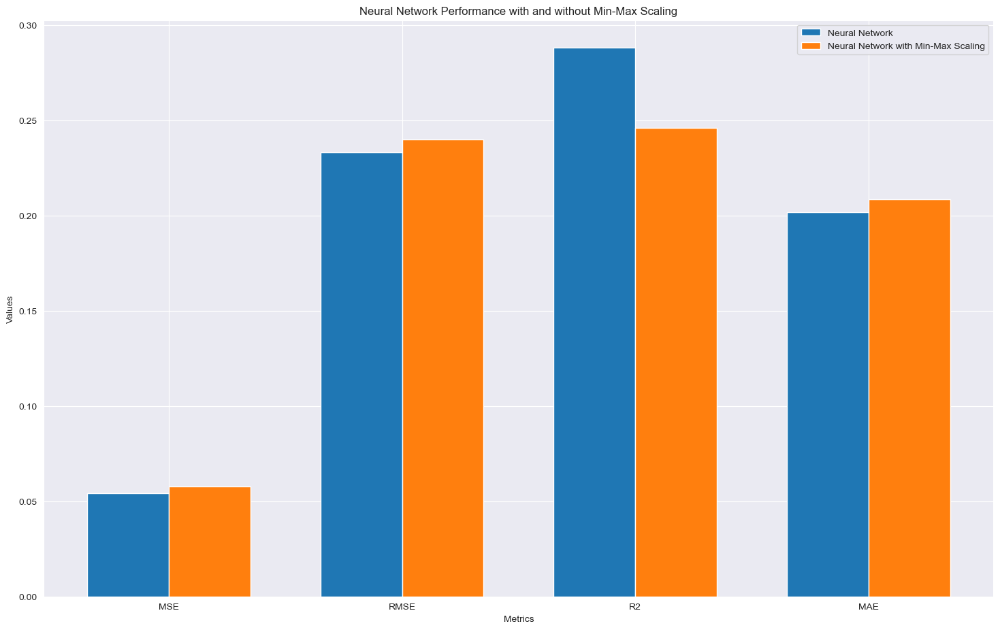

In [145]:
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the neural network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions on the test set
y_pred_nn = model.predict(X_test).flatten()

# Evaluate the Neural Network model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
r2_nn = r2_score(y_test, y_pred_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)



# Select the columns that need to be used as features for Linear Regression
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Min-Max Scaler
scaler = MinMaxScaler()

# Apply Min-Max Scaling to the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the neural network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model on the scaled data
model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions on the scaled test set
y_pred_nn_scaled = model.predict(X_test_scaled).flatten()

# Evaluate the Neural Network model with Min-Max Scaling
mse_nn_scaled = mean_squared_error(y_test, y_pred_nn_scaled)
rmse_nn_scaled = np.sqrt(mse_nn_scaled)
r2_nn_scaled = r2_score(y_test, y_pred_nn_scaled)
mae_nn_scaled = mean_absolute_error(y_test, y_pred_nn_scaled)

# Print the regression metrics for the Neural Network
print('\nNeural Network Metrics:')
print(f'Mean Squared Error (MSE) - Neural Network: {mse_nn}')
print(f'Root Mean Squared Error (RMSE) - Neural Network: {rmse_nn}')
print(f'R-squared (R2) - Neural Network: {r2_nn}')
print(f'Mean Absolute Error (MAE) - Neural Network: {mae_nn}')

# Print the regression metrics for the Neural Network with Min-Max Scaling
print('\n Neural Network Metrics Min-Max Scaling:')
print(f'Mean Squared Error (MSE) - Neural Network with Min-Max Scaling: {mse_nn_scaled}')
print(f'Root Mean Squared Error (RMSE) - Neural Network with Min-Max Scaling: {rmse_nn_scaled}')
print(f'R-squared (R2) - Neural Network with Min-Max Scaling: {r2_nn_scaled}')
print(f'Mean Absolute Error (MAE) - Neural Network with Min-Max Scaling: {mae_nn_scaled}')

# Define the metrics for the two models
metrics_labels = ['MSE', 'RMSE', 'R2', 'MAE']
nn_metrics = [mse_nn, rmse_nn, r2_nn, mae_nn]
nn_scaled_metrics = [mse_nn_scaled, rmse_nn_scaled, r2_nn_scaled, mae_nn_scaled]

# Set up the bar graph
bar_width = 0.35
index = np.arange(len(metrics_labels))

# Create bars for Neural Network and Neural Network with Min-Max Scaling
plt.bar(index, nn_metrics, bar_width, label='Neural Network')
plt.bar(index + bar_width, nn_scaled_metrics, bar_width, label='Neural Network with Min-Max Scaling')

# Labeling and customization
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Neural Network Performance with and without Min-Max Scaling')
plt.xticks(index + bar_width / 2, metrics_labels)
plt.legend()

# Show the bar graph
plt.show()

Epoch 1/50
6/6 [==============================] - 1s 22ms/step - loss: 0.3061 - val_loss: 0.0876
Epoch 2/50
6/6 [==============================] - 0s 7ms/step - loss: 0.1076 - val_loss: 0.0930
Epoch 3/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0926 - val_loss: 0.0771
Epoch 4/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0654 - val_loss: 0.0603
Epoch 5/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0619 - val_loss: 0.0598
Epoch 6/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0579 - val_loss: 0.0649
Epoch 7/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0555 - val_loss: 0.0668
Epoch 8/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0524 - val_loss: 0.0608
Epoch 9/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0497 - val_loss: 0.0599
Epoch 10/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0480 - val_loss: 0.0642
Epoch 11/50
6/6 [=====================

C:\Users\bhakt\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.

C:\Users\bhakt\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.

C:\Users\bhakt\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.

C:\Users\bhakt\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.

C:\Users\bhakt\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimiz

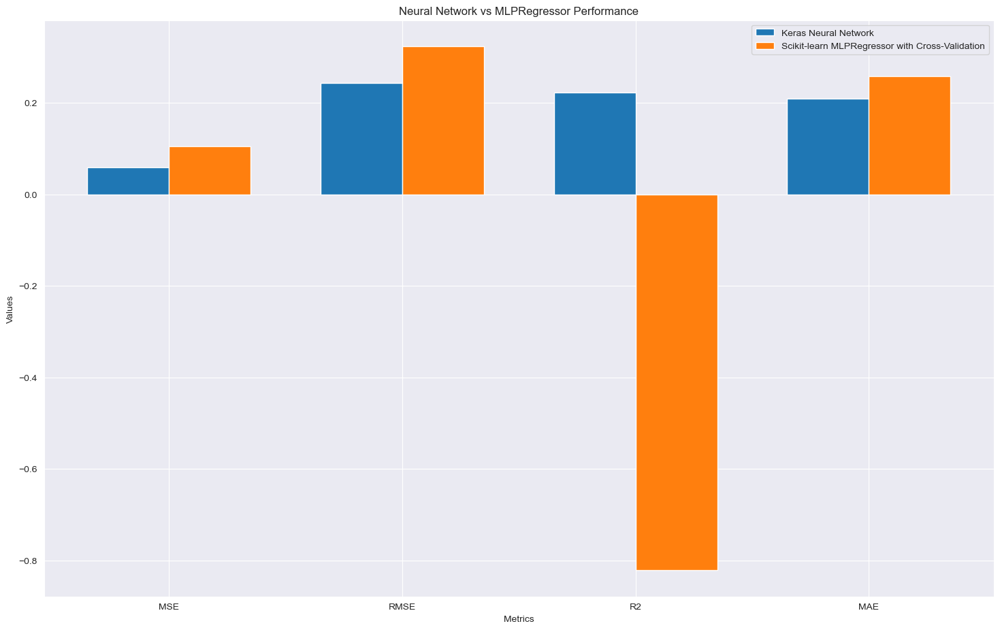

In [147]:
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

# Define the features and target variable
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build and train the Keras Neural Network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)
y_pred_nn = model.predict(X_test).flatten()

# Evaluate the Keras Neural Network model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
r2_nn = r2_score(y_test, y_pred_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)



# Define a function to create the scikit-learn MLPRegressor model
def create_nn_model():
    model = MLPRegressor(hidden_layer_sizes=(64, 32), activation='relu', solver='adam', max_iter=50)
    return make_pipeline(StandardScaler(), model)

# Use cross_val_predict to get predictions for each fold
y_pred_cv = cross_val_predict(create_nn_model(), X_train, y_train, cv=5)




# Evaluate the scikit-learn MLPRegressor model with cross-validation
cv_mse = mean_squared_error(y_train, y_pred_cv)
cv_rmse = np.sqrt(cv_mse)
cv_r2 = r2_score(y_train, y_pred_cv)
cv_mae = mean_absolute_error(y_train, y_pred_cv)

# Print the regression metrics for the Neural Network
print('\nNeural Network Metrics:')
print(f'Mean Squared Error (MSE) - Neural Network: {mse_nn}')
print(f'Root Mean Squared Error (RMSE) - Neural Network: {rmse_nn}')
print(f'R-squared (R2) - Neural Network: {r2_nn}')
print(f'Mean Absolute Error (MAE) - Neural Network: {mae_nn}')

# Print the regression metrics for cross-validation
print('\nNeural Network Metrics for cross-validation:')
print(f'Mean Squared Error (MSE) - Cross-Validation: {cv_mse:.4f}')
print(f'Root Mean Squared Error (RMSE) - Cross-Validation: {cv_rmse:.4f}')
print(f'R-squared (R2) - Cross-Validation: {cv_r2:.4f}')
print(f'Mean Absolute Error (MAE) - Cross-Validation: {cv_mae:.4f}')

# # Print the regression metrics
# print(f'Keras Neural Network Metrics:')
# print(f'MSE: {mse_nn:.4f}, RMSE: {rmse_nn:.4f}, R2: {r2_nn:.4f}, MAE: {mae_nn:.4f}')

# print(f'Scikit-learn MLPRegressor Metrics with Cross-Validation:')
# print(f'MSE: {cv_mse:.4f}, RMSE: {cv_rmse:.4f}, R2: {cv_r2:.4f}, MAE: {cv_mae:.4f}')

# Create a bar graph to compare the performance of the Neural Network models
labels = ['MSE', 'RMSE', 'R2', 'MAE']
nn_metrics = [mse_nn, rmse_nn, r2_nn, mae_nn]
cv_metrics = [cv_mse, cv_rmse, cv_r2, cv_mae]

bar_width = 0.35
index = np.arange(len(labels))

plt.bar(index, nn_metrics, bar_width, label='Keras Neural Network')
plt.bar(index + bar_width, cv_metrics, bar_width, label='Scikit-learn MLPRegressor with Cross-Validation')

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Neural Network vs MLPRegressor Performance')
plt.xticks(index + bar_width / 2, labels)
plt.legend()
plt.show()


Epoch 1/50
6/6 [==============================] - 1s 22ms/step - loss: 0.2085 - val_loss: 0.0956
Epoch 2/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0998 - val_loss: 0.0923
Epoch 3/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0892 - val_loss: 0.0701
Epoch 4/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0671 - val_loss: 0.0619
Epoch 5/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0600 - val_loss: 0.0601
Epoch 6/50
6/6 [==============================] - 0s 7ms/step - loss: 0.0560 - val_loss: 0.0598
Epoch 7/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0519 - val_loss: 0.0631
Epoch 8/50
6/6 [==============================] - 0s 5ms/step - loss: 0.0486 - val_loss: 0.0623
Epoch 9/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0468 - val_loss: 0.0598
Epoch 10/50
6/6 [==============================] - 0s 6ms/step - loss: 0.0461 - val_loss: 0.0627
Epoch 11/50
6/6 [=====================

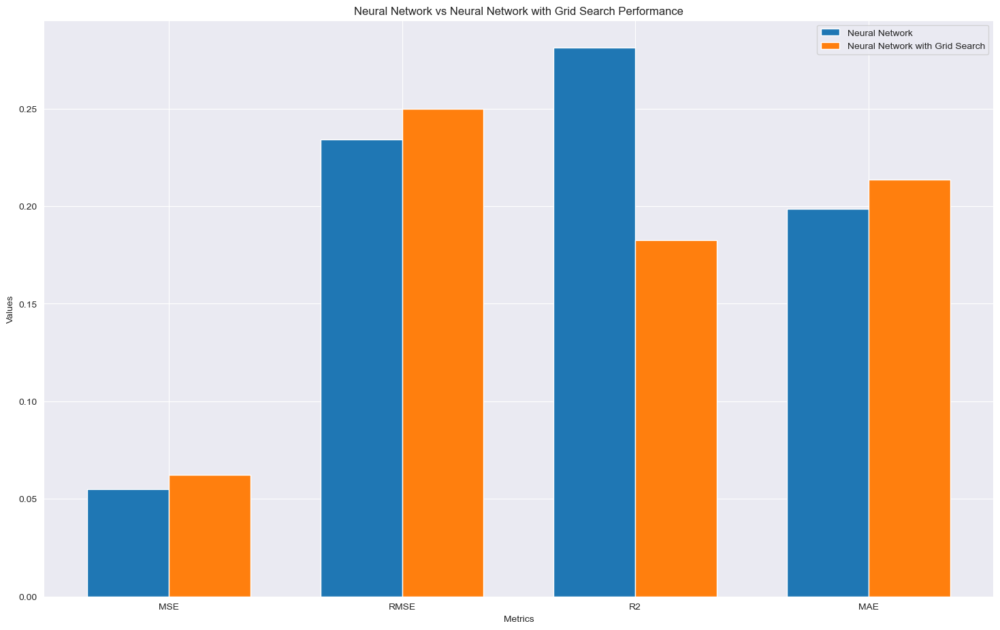

In [149]:
features = ['is_demo', 'number_of_verses', 'number_of_chorus', 'Positive Sentiment', 'Neutral Sentiment', 'Negative Sentiment', 
            '# Of Words', '# Of StopWords', 'Average Word Length', 'Average Sentence Length']

# Extract features and target variable
X = preprocessed[features]
y = preprocessed['track_views']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the neural network model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1)  # Output layer with one neuron for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions on the test set
y_pred_nn = model.predict(X_test).flatten()

# Evaluate the Neural Network model
mse_nn = mean_squared_error(y_test, y_pred_nn)
rmse_nn = np.sqrt(mse_nn)
r2_nn = r2_score(y_test, y_pred_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)



# Define the parameter grid for the grid search
param_grid = {
    'mlpregressor__hidden_layer_sizes': [(64,), (64, 32), (32, 16)],
    'mlpregressor__activation': ['relu', 'tanh'],
    'mlpregressor__solver': ['adam', 'sgd'],
    'mlpregressor__max_iter': [50, 100, 200]
}

# Create the neural network model using MLPRegressor and StandardScaler
nn_model = make_pipeline(StandardScaler(), MLPRegressor())

# Initialize GridSearchCV
grid_search = GridSearchCV(nn_model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_model = grid_search.best_estimator_

# Make predictions on the test set using the best model
y_pred_gridsearch = best_model.predict(X_test)

# Evaluate the Neural Network model with grid search
mse_gridsearch = mean_squared_error(y_test, y_pred_gridsearch)
rmse_gridsearch = np.sqrt(mse_gridsearch)
r2_gridsearch = r2_score(y_test, y_pred_gridsearch)
mae_gridsearch = mean_absolute_error(y_test, y_pred_gridsearch)

# Print the regression metrics for the Neural Network
print('\nNeural Network Metrics:')
print(f'Mean Squared Error (MSE) - Neural Network: {mse_nn}')
print(f'Root Mean Squared Error (RMSE) - Neural Network: {rmse_nn}')
print(f'R-squared (R2) - Neural Network: {r2_nn}')
print(f'Mean Absolute Error (MAE) - Neural Network: {mae_nn}')

# Print the regression metrics for the Neural Network with grid search
print('\nNeural Network Metrics with grid search:')
print(f'Mean Squared Error (MSE) - Neural Network with Grid Search: {mse_gridsearch:.4f}')
print(f'Root Mean Squared Error (RMSE) - Neural Network with Grid Search: {rmse_gridsearch:.4f}')
print(f'R-squared (R2) - Neural Network with Grid Search: {r2_gridsearch:.4f}')
print(f'Mean Absolute Error (MAE) - Neural Network with Grid Search: {mae_gridsearch:.4f}')

# Define the metric labels and values for the two models
metric_labels = ['MSE', 'RMSE', 'R2', 'MAE']
nn_metrics = [mse_nn, rmse_nn, r2_nn, mae_nn]
gridsearch_metrics = [mse_gridsearch, rmse_gridsearch, r2_gridsearch, mae_gridsearch]

# Set up the bar graph
bar_width = 0.35
index = np.arange(len(metric_labels))

# Create bars for Neural Network and Neural Network with Grid Search
plt.bar(index, nn_metrics, bar_width, label='Neural Network')
plt.bar(index + bar_width, gridsearch_metrics, bar_width, label='Neural Network with Grid Search')

# Labeling and customization
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Neural Network vs Neural Network with Grid Search Performance')
plt.xticks(index + bar_width / 2, metric_labels)
plt.legend()

# Show the bar graph
plt.show()